# ***Before Any Preprocessing***

Image Counts per Class: {'benign': 437, 'normal': 133, 'malignant': 210}
Training set shape: (663, 128, 128, 3), Testing set shape: (117, 128, 128, 3)
Training labels shape: (663, 3), Testing labels shape: (117, 3)
80134624/80134624 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ vgg19 (Functional)              │ ?                      │    20,024,384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ ?                      │   0 (unbuilt) │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ ?                      │   0 (unbuilt) │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ ?                      │   0 (unbuilt) │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ ?                      │   0 (unbuilt) │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ ?                      │   0 (unbuilt) │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ ?                      │   0 (unbuilt) │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 20,024,384 (76.39 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 20,024,384 (76.39 MB)

Epoch 1/150
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 904ms/step - accuracy: 0.3559 - loss: 17.8614
Epoch 1: val_accuracy improved from -inf to 0.59701, saving model to best_model.keras
75/75 ━━━━━━━━━━━━━━━━━━━━ 80s 1s/step - accuracy: 0.3563 - loss: 17.8608 - val_accuracy: 0.5970 - val_loss: 16.8352
Epoch 2/150
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 901ms/step - accuracy: 0.4258 - loss: 17.3750
Epoch 2: val_accuracy improved from 0.59701 to 0.62687, saving model to best_model.keras
75/75 ━━━━━━━━━━━━━━━━━━━━ 76s 1s/step - accuracy: 0.4263 - loss: 17.3722 - val_accuracy: 0.6269 - val_loss: 16.4659
Epoch 3/150
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 894ms/step - accuracy: 0.4811 - loss: 16.6812
Epoch 3: val_accuracy improved from 0.62687 to 0.68657, saving model to best_model.keras
75/75 ━━━━━━━━━━━━━━━━━━━━ 75s 1s/step - accuracy: 0.4813 - loss: 16.6794 - val_accuracy: 0.6866 - val_loss: 16.0006
Epoch 4/150
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 894ms/step - accuracy: 0.5835 - loss: 16.0375
Epoch 4: val_accuracy did not imp

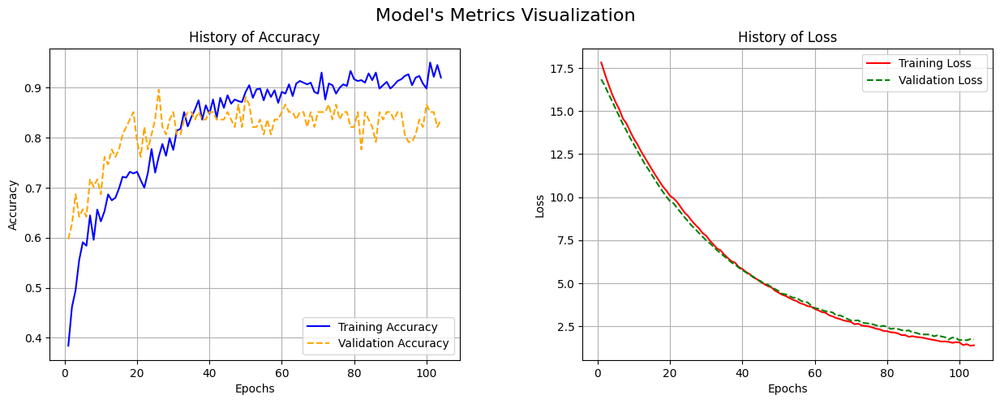

<Figure size 800x600 with 0 Axes>

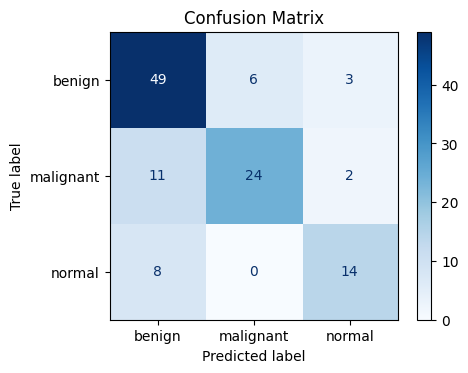

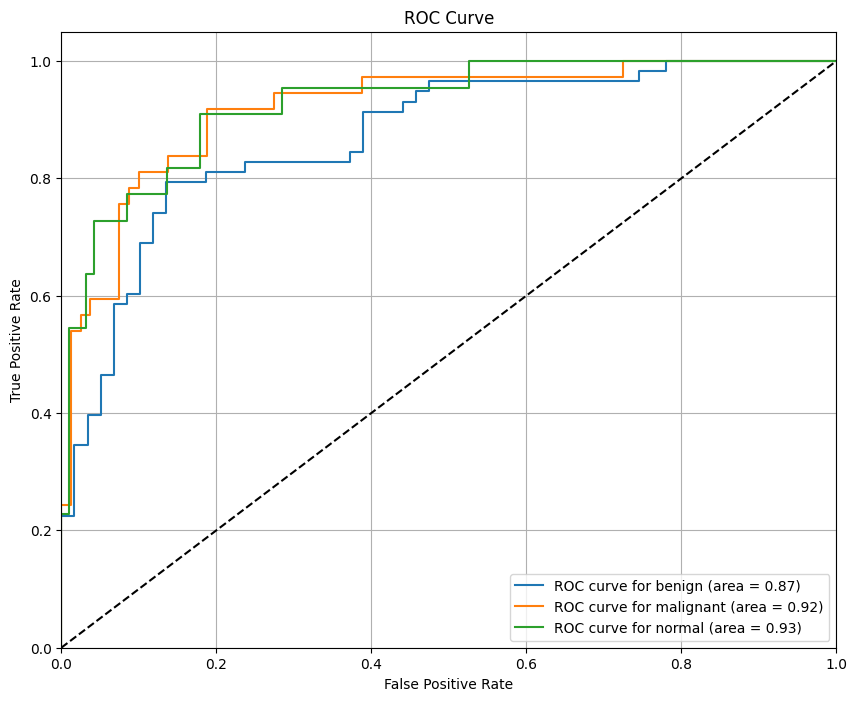

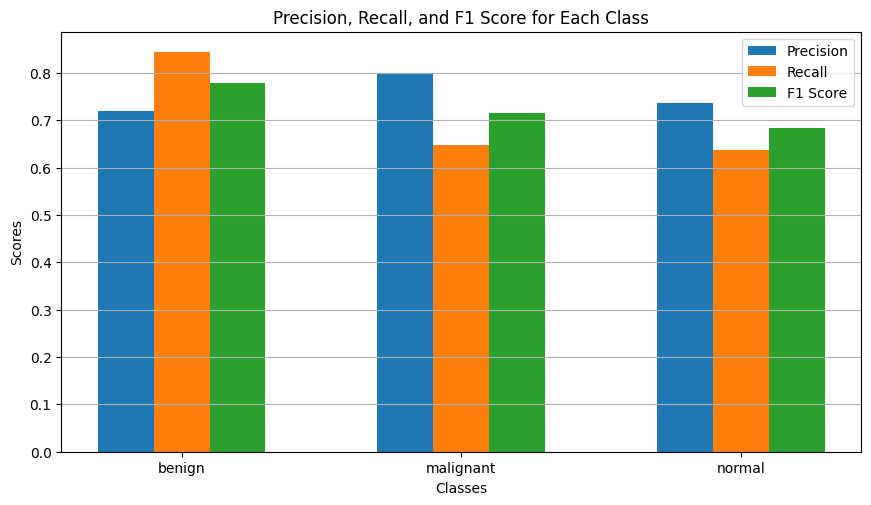

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
Prediction time for 12 samples: 2.6073 seconds


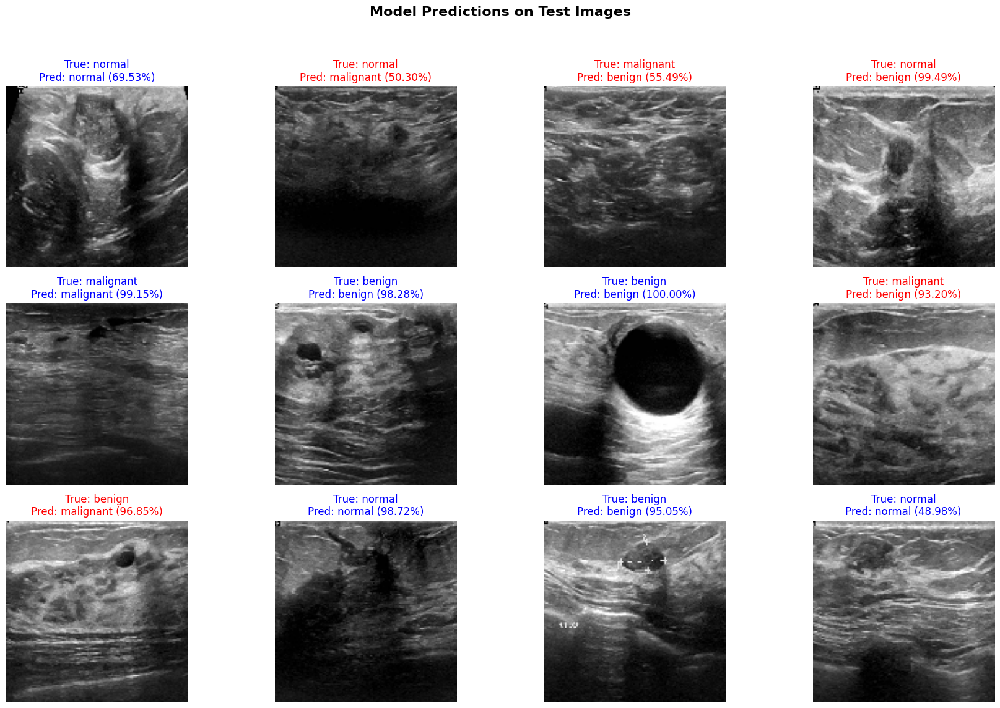

In [1]:
import numpy as np
import pandas as pd
import tensorflow as tf
import random
from tensorflow import keras
from tensorflow.keras.applications.vgg19 import VGG19
from tensorflow.keras.preprocessing.image import load_img, img_to_array, ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import (Conv2D, MaxPooling2D, AveragePooling2D,
                                     BatchNormalization, Dense, Activation,
                                     Flatten, Dropout)
from tensorflow.keras.optimizers import SGD, Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
import cv2
import matplotlib.pyplot as plt
import os
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import f1_score, roc_auc_score, cohen_kappa_score, confusion_matrix, precision_score, recall_score, RocCurveDisplay
from sklearn.metrics import roc_curve, auc, confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import RocCurveDisplay

# Define the path
path = "/kaggle/input/breast-ultrasound-images-dataset/Dataset_BUSI_with_GT"
dir_list = [os.path.join(path, i) for i in os.listdir(path)]

# Count images per label
def count_images_per_class(path):
    counts = {'benign': 0, 'normal': 0, 'malignant': 0}
    for class_name in counts:
        folder = os.path.join(path, class_name)
        counts[class_name] = sum('mask' not in img for img in os.listdir(folder))
    return counts

image_counts = count_images_per_class(path)
print("Image Counts per Class:", image_counts)

# Prepare images and labels
img_size, img_channel = 128, 3
img_shape = (img_size, img_size, img_channel)
images = []
labels = []
for class_name in ['benign', 'normal', 'malignant']:
    class_folder = os.path.join(path, class_name)
    for image_name in os.listdir(class_folder):
        if 'mask' not in image_name:
            img_path = os.path.join(class_folder, image_name)
            img = load_img(img_path, target_size=(img_size, img_size))
            img_array = img_to_array(img) / 255.0  # Normalize the images
            images.append(img_array)
            labels.append(class_name)

# Convert to numpy arrays
x = np.array(images)
y = np.array(labels)

# One-hot encode labels
encoder = OneHotEncoder()
y = encoder.fit_transform(y.reshape(-1, 1))

# Split the dataset
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.15, shuffle=True, random_state=42)
print(f"Training set shape: {x_train.shape}, Testing set shape: {x_test.shape}")
print(f"Training labels shape: {y_train.shape}, Testing labels shape: {y_test.shape}")



# Function to evaluate the model
def evaluation(model, x_train, y_train, x_val, y_val, x_test, y_test, history):
    train_loss, train_acc = model.evaluate(x_train, y_train.toarray())
    val_loss, val_acc = model.evaluate(x_val, y_val.toarray())
    test_loss_value, test_accuracy = model.evaluate(x_test, y_test.toarray())

    y_pred = model.predict(x_test)
    y_pred_label = np.argmax(y_pred, axis=1)
    y_true_label = np.argmax(y_test.toarray(), axis=1)

    f1_measure = f1_score(y_true_label, y_pred_label, average='weighted')
    roc_score = roc_auc_score(y_test.toarray(), y_pred)
    kappa_score = cohen_kappa_score(y_true_label, y_pred_label)
    precision = precision_score(y_true_label, y_pred_label, average='weighted')
    recall = recall_score(y_true_label, y_pred_label, average='weighted')
    cm = confusion_matrix(y_true_label, y_pred_label)

    print("\n--- Model Evaluation Metrics ---")
    print(f"Train accuracy: {train_acc:.4f}")
    print(f"Validation accuracy: {val_acc:.4f}")
    print(f"Test accuracy: {test_accuracy:.4f}")
    print(f"F1 Score: {f1_measure:.4f}")
    print(f"Kappa Score: {kappa_score:.4f}")
    print(f"ROC AUC Score: {roc_score:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"Recall: {recall:.4f}")

    return y_true_label, y_pred, cm


# Plotting function for model performance metrics with improved alignment and spacing
def Plotting(acc, val_acc, loss, val_loss, y_true, y_pred, cm):
    # Plot accuracy and loss
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
    fig.suptitle("Model's Metrics Visualization", fontsize=16)

    # Accuracy Plot
    ax1.plot(range(1, len(acc) + 1), acc, label='Training Accuracy', color='blue', linestyle='-')
    ax1.plot(range(1, len(val_acc) + 1), val_acc, label='Validation Accuracy', color='orange', linestyle='--')
    ax1.set_title('History of Accuracy')
    ax1.set_xlabel('Epochs')
    ax1.set_ylabel('Accuracy')
    ax1.legend()
    ax1.grid(True)

    # Loss Plot
    ax2.plot(range(1, len(loss) + 1), loss, label='Training Loss', color='red', linestyle='-')
    ax2.plot(range(1, len(val_loss) + 1), val_loss, label='Validation Loss', color='green', linestyle='--')
    ax2.set_title('History of Loss')
    ax2.set_xlabel('Epochs')
    ax2.set_ylabel('Loss')
    ax2.legend()
    ax2.grid(True)

    plt.subplots_adjust(wspace=0.3, hspace=0.5)  # Adjust space between accuracy and loss plots
    plt.show()

    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=encoder.categories_[0])
    disp.plot(cmap=plt.cm.Blues)
    plt.title("Confusion Matrix")
    plt.grid(False)  # Remove grid for clarity
    plt.subplots_adjust(left=0.2, right=0.8, top=0.8, bottom=0.2)  # Adjust spacing for clarity
    plt.show()

    # Plot ROC Curve for each class
    plt.figure(figsize=(10, 8))
    for i in range(len(encoder.categories_[0])):
        fpr, tpr, _ = roc_curve(y_true, y_pred[:, i], pos_label=i)
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, label=f'ROC curve for {encoder.categories_[0][i]} (area = {roc_auc:.2f})')

    plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend(loc='lower right')
    plt.grid(True)
    plt.show()

    # Calculate precision, recall, and F1 score for each class
    precision = precision_score(y_true, y_pred.argmax(axis=1), average=None)
    recall = recall_score(y_true, y_pred.argmax(axis=1), average=None)
    f1 = f1_score(y_true, y_pred.argmax(axis=1), average=None)

    # Bar plot for precision, recall, and F1 score with improved spacing
    metrics = [precision, recall, f1]
    metrics_names = ['Precision', 'Recall', 'F1 Score']
    class_labels = encoder.categories_[0]

    x = np.arange(len(class_labels))  # Label locations
    width = 0.2  # Width of the bars

    fig, ax = plt.subplots(figsize=(10, 6))
    for i, metric in enumerate(metrics):
        ax.bar(x + i * width, metric, width, label=metrics_names[i])

    ax.set_xlabel('Classes')
    ax.set_ylabel('Scores')
    ax.set_title('Precision, Recall, and F1 Score for Each Class')
    ax.set_xticks(x + width)
    ax.set_xticklabels(class_labels)
    ax.legend()
    plt.grid(axis='y')  # Add gridlines for readability
    plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.2)  # Adjust space around bar plots
    plt.show()



 #Fit and evaluate the model, and visualize the performance
def fit_evaluate(model, x_train, y_train, x_test, y_test, bs, Epochs, patience):
    # Early stopping to prevent overfitting
    es = EarlyStopping(monitor='val_loss', mode='min', patience=patience, restore_best_weights=True, verbose=1)
    # Model checkpoint to save the best model based on validation accuracy
    mc = ModelCheckpoint('best_model.keras', monitor='val_accuracy', mode='max', save_best_only=True, verbose=1)
    
    # Split training data further into train and validation sets
    x1_train, x_val, y1_train, y_val = train_test_split(x_train, y_train, test_size=0.1, random_state=42, stratify=y_train.toarray())
    
    # Fit the model
    history = model.fit(x1_train, y1_train.toarray(),
                        validation_data=(x_val, y_val.toarray()),
                        epochs=Epochs,
                        batch_size=bs,
                        callbacks=[es, mc])

    # Retrieve history for training and validation metrics
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    # Evaluate the model and collect true/predicted labels
    y_true, y_pred, cm = evaluation(model, x1_train, y1_train, x_val, y_val, x_test, y_test, history)

    # Plot training history, ROC curves, and class-specific precision, recall, and F1 score
    Plotting(acc, val_acc, loss, val_loss, y_true, y_pred, cm)


# Load the VGG19 model
base_model = VGG19(
    include_top=False,
    weights="imagenet",
    input_shape=img_shape,
)

for layer in base_model.layers:
    layer.trainable = False    

    
# Define and compile the VGG19 model
def VGG19():
    model = Sequential()
    model.add(base_model)
    model.add(Flatten())
    model.add(BatchNormalization())
    model.add(Dense(512, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01)))  # L2 Regularization
    model.add(BatchNormalization())
    model.add(Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01)))  # L2 Regularization
    model.add(BatchNormalization())
    model.add(Dropout(0.6))
    model.add(Dense(128, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01)))
    model.add(BatchNormalization())
    model.add(Dropout(0.6))
    model.add(Dense(64, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01)))
    model.add(BatchNormalization())
    model.add(Dropout(0.6))
    model.add(Dense(3, activation='softmax'))
    
    model.compile(optimizer=SGD(learning_rate=0.001, momentum=0.9), loss='categorical_crossentropy', metrics=['accuracy'])
    return model
    

    
    
# Instantiate and compile the VGG19 model
model = VGG19()
model.summary()

# Train the model and visualize performance
fit_evaluate(model, x_train, y_train, x_test, y_test, bs=8, Epochs=150, patience=4)



# Function to visualize multiple predictions from the dataset with added comments
import time

def visualize_model_performance(model, x_test, y_test, class_labels=['benign', 'normal', 'malignant'], num_samples=12):
    """
    Visualizes model predictions on test dataset images and logs prediction time.

    Args:
        model: Trained model to make predictions.
        x_test: Test dataset images.
        y_test: True labels for the test dataset (encoded as one-hot or sparse matrix).
        class_labels: List of class names corresponding to the labels.
        num_samples: Number of images to visualize.
    """
    # Select the first `num_samples` images from the test set
    test_images = x_test[:num_samples]
    true_labels = y_test.toarray()[:num_samples]  # Convert sparse matrix to array if needed
    true_labels = np.argmax(true_labels, axis=1)  # Get true class indices

    # Measure prediction time
    start_time = time.time()
    predictions = model.predict(test_images)
    end_time = time.time()
    prediction_time = end_time - start_time  # Calculate total prediction time

    # Log prediction time
    print(f"Prediction time for {num_samples} samples: {prediction_time:.4f} seconds")

    # Get predicted class indices
    predicted_labels = np.argmax(predictions, axis=1)

    # Set up the plotting layout for 4 images per row
    plt.figure(figsize=(18, 12))
    rows = num_samples // 4 + int(num_samples % 4 != 0)  # Calculate the required number of rows

    for i, (img, true_label, pred_label, pred_prob) in enumerate(zip(test_images, true_labels, predicted_labels, predictions)):
        plt.subplot(rows, 4, i + 1)  # Arrange images in 4 columns
        plt.imshow(img)
        plt.axis('off')
        plt.title(f"True: {class_labels[true_label]}\nPred: {class_labels[pred_label]} ({max(pred_prob) * 100:.2f}%)",
                  fontsize=12, color="blue" if true_label == pred_label else "red")  # Color title based on correctness

    # Add bold title and adjust spacing
    plt.subplots_adjust(wspace=0.4, hspace=0.6)  # Adjust spacing between plots
    plt.suptitle("Model Predictions on Test Images", fontsize=16, fontweight="bold")
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

# Call the updated function to visualize predictions on the first 12 test images
visualize_model_performance(model, x_test, y_test)


# ***After Preprocessing***

Image Counts per Class: {'benign': 437, 'normal': 133, 'malignant': 210}
Training set shape: (663, 128, 128, 3), Testing set shape: (117, 128, 128, 3)
Training labels shape: (663, 3), Testing labels shape: (117, 3)


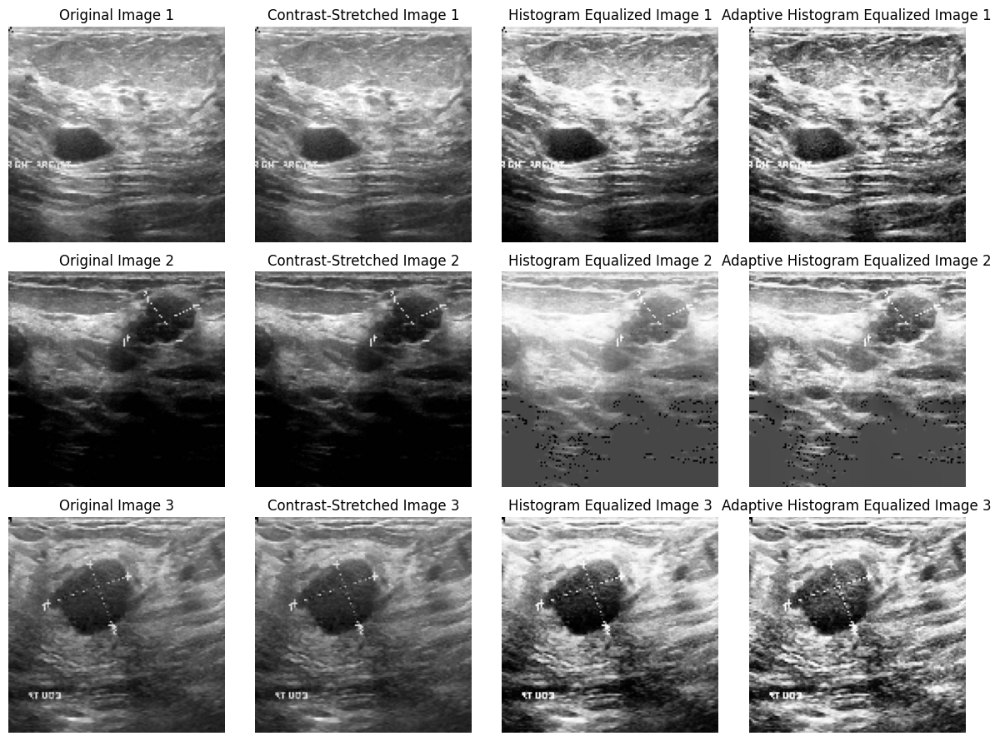

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ vgg19 (Functional)              │ ?                      │    20,024,384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ ?                      │   0 (unbuilt) │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ ?                      │   0 (unbuilt) │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_7           │ ?                      │   0 (unbuilt) │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_8           │ ?                      │   0 (unbuilt) │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_9           │ ?                      │   0 (unbuilt) │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ ?                      │   0 (unbuilt) │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 20,024,384 (76.39 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 20,024,384 (76.39 MB)

Epoch 1/150
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 907ms/step - accuracy: 0.3309 - loss: 17.8713
Epoch 1: val_accuracy improved from -inf to 0.58209, saving model to best_model.keras
75/75 ━━━━━━━━━━━━━━━━━━━━ 81s 1s/step - accuracy: 0.3314 - loss: 17.8733 - val_accuracy: 0.5821 - val_loss: 17.6026
Epoch 2/150
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 908ms/step - accuracy: 0.4187 - loss: 17.9581
Epoch 2: val_accuracy improved from 0.58209 to 0.65672, saving model to best_model.keras
75/75 ━━━━━━━━━━━━━━━━━━━━ 76s 1s/step - accuracy: 0.4189 - loss: 17.9559 - val_accuracy: 0.6567 - val_loss: 17.0978
Epoch 3/150
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 913ms/step - accuracy: 0.4475 - loss: 17.3704
Epoch 3: val_accuracy did not improve from 0.65672
75/75 ━━━━━━━━━━━━━━━━━━━━ 76s 1s/step - accuracy: 0.4476 - loss: 17.3683 - val_accuracy: 0.6567 - val_loss: 16.7128
Epoch 4/150
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 905ms/step - accuracy: 0.5333 - loss: 16.8001
Epoch 4: val_accuracy improved from 0.65672 to 0.68657, saving model to

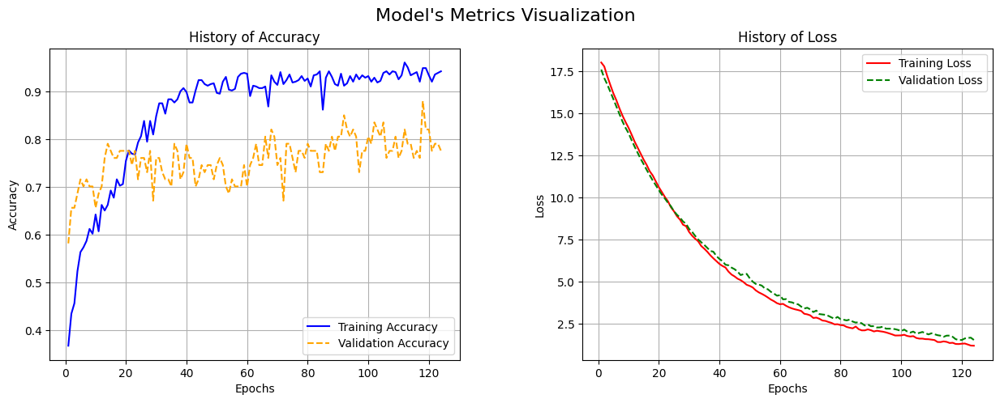

<Figure size 800x600 with 0 Axes>

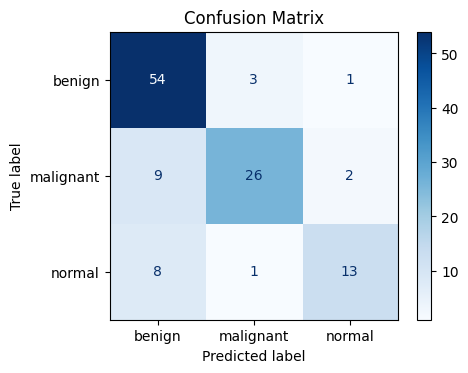

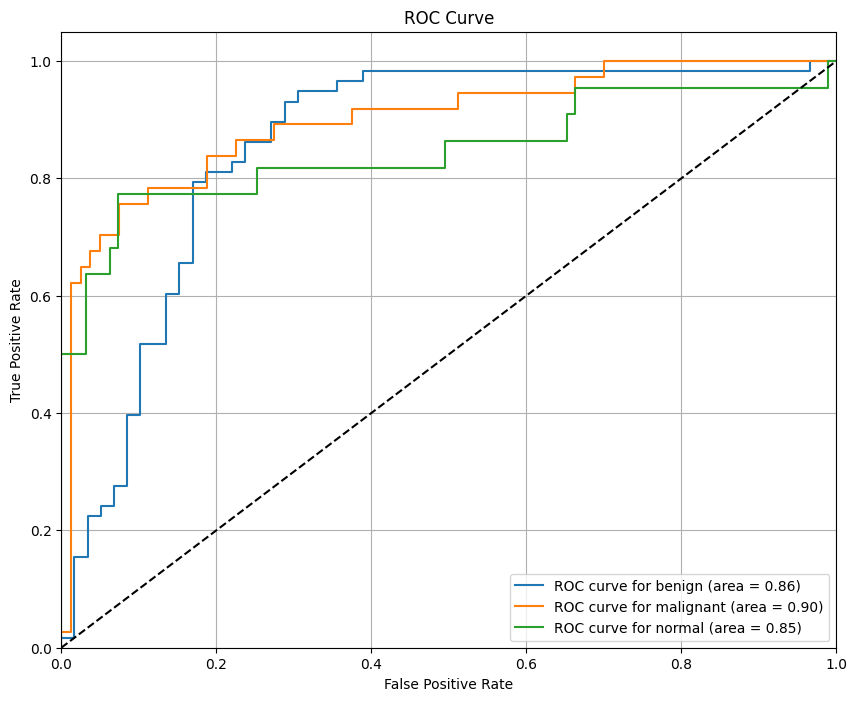

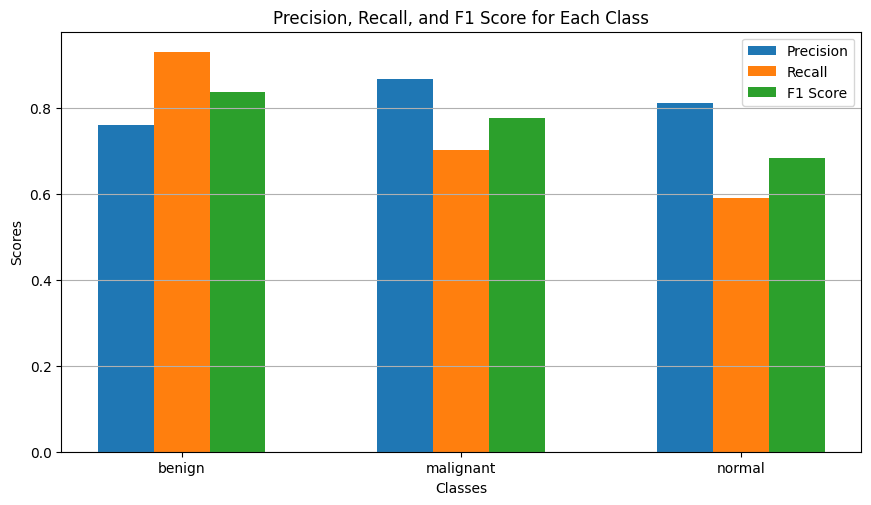

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
Prediction time for 12 samples: 1.3625 seconds


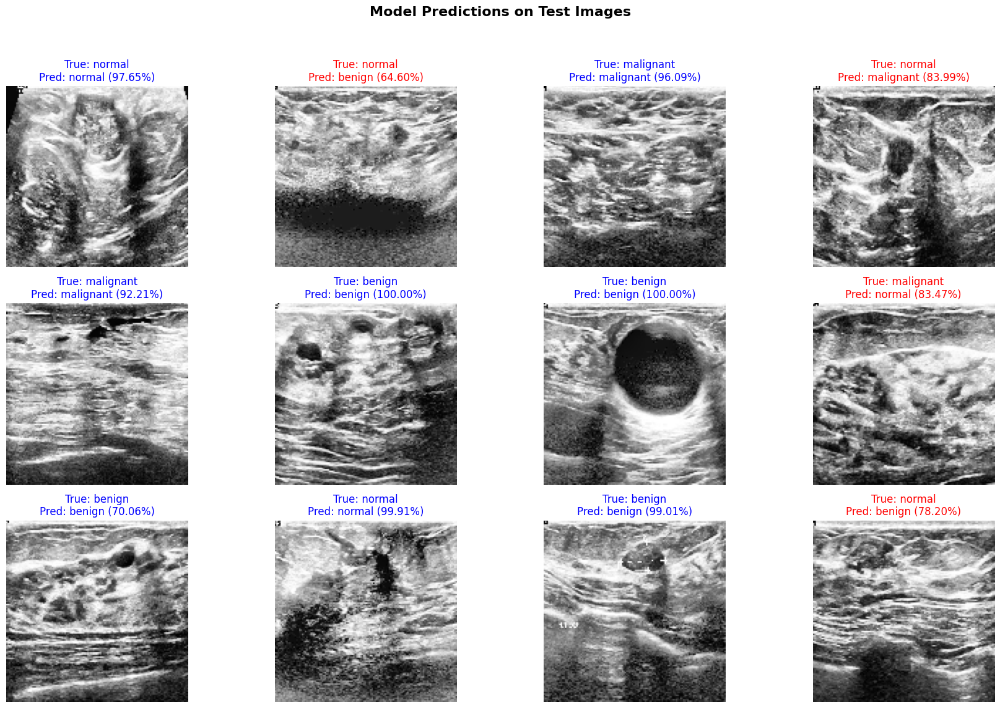

In [2]:
import numpy as np
import pandas as pd
import tensorflow as tf
import random
from tensorflow import keras
from tensorflow.keras.applications.vgg19 import VGG19
from tensorflow.keras.preprocessing.image import load_img, img_to_array, ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import (Conv2D, MaxPooling2D, AveragePooling2D,
                                     BatchNormalization, Dense, Activation,
                                     Flatten, Dropout)
from tensorflow.keras.optimizers import SGD, Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
import cv2
import matplotlib.pyplot as plt
import os
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import f1_score, roc_auc_score, cohen_kappa_score, confusion_matrix, precision_score, recall_score, RocCurveDisplay
from sklearn.metrics import roc_curve, auc, confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import RocCurveDisplay

# Define the path
path = "/kaggle/input/breast-ultrasound-images-dataset/Dataset_BUSI_with_GT"
dir_list = [os.path.join(path, i) for i in os.listdir(path)]

# Count images per label
def count_images_per_class(path):
    counts = {'benign': 0, 'normal': 0, 'malignant': 0}
    for class_name in counts:
        folder = os.path.join(path, class_name)
        counts[class_name] = sum('mask' not in img for img in os.listdir(folder))
    return counts

image_counts = count_images_per_class(path)
print("Image Counts per Class:", image_counts)

def contrast_stretching(image):
    min_pixel = np.min(image)
    max_pixel = np.max(image)
    stretched = (image - min_pixel) / (max_pixel - min_pixel)
    return stretched



def histogram_equalization(image):
    # Convert the image to uint8 if it's not
    if image.dtype != np.uint8:
        image = (image * 255).astype(np.uint8)  # Scale and convert
    # Convert to grayscale if RGB
    if len(image.shape) == 3 and image.shape[-1] == 3:
        gray_image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    else:
        gray_image = image

    # Normalize pixel values to 0-255
    normalized_image = cv2.normalize(gray_image, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

    # Apply histogram equalization
    equalized_image = cv2.equalizeHist(normalized_image)

    # Convert grayscale output to RGB
    rgb_image = cv2.cvtColor(equalized_image, cv2.COLOR_GRAY2RGB)

    return rgb_image




def adaptive_histogram_equalization(image):
    # Convert the image to uint8 if it's not
    if image.dtype != np.uint8:
        image = (image * 255).astype(np.uint8)  # Scale and convert
    
    # Convert to grayscale if RGB
    if len(image.shape) == 3 and image.shape[-1] == 3:
        gray_image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    else:
        gray_image = image

    # Normalize pixel values to 0-255
    normalized_image = cv2.normalize(gray_image, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

    # Create a CLAHE object
    # clipLimit: Threshold for contrast limiting
    # tileGridSize: Size of the grid for histogram equalization
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    
    # Apply CLAHE to the normalized image
    equalized_image = clahe.apply(normalized_image)

    # Convert grayscale output to RGB
    rgb_image = cv2.cvtColor(equalized_image, cv2.COLOR_GRAY2RGB)

    return rgb_image




# Prepare images and labels
img_size, img_channel = 128, 3
img_shape = (img_size, img_size, img_channel)
images = []
labels = []
original_images = []  # To store the original images (before any preprocessing)
hist_images = []
contrast_images = []
adapt_hist_images = []
for class_name in ['benign', 'normal', 'malignant']:
    class_folder = os.path.join(path, class_name)
    for image_name in os.listdir(class_folder):
        if 'mask' not in image_name:
            img_path = os.path.join(class_folder, image_name)
            img = load_img(img_path, target_size=(img_size, img_size))
            
            # Store the original image before any preprocessing
            img_array = img_to_array(img) / 255.0  # Normalize the images
            original_images.append(img_array.copy())  # Storing original image
            
            # Apply contrast stretching after loading
            contrast_stretched_image = contrast_stretching(img_array)  # Apply contrast stretching
            contrast_images.append(contrast_stretched_image)

            # Apply histogram equalization after loading
            histogram_equalized_image = histogram_equalization(contrast_stretched_image)
            hist_images.append(histogram_equalized_image)

            # Apply adaptive histogram equalization after loading
            adaptive_histogram_equalized_image = adaptive_histogram_equalization(histogram_equalized_image)
            adapt_hist_images.append(adaptive_histogram_equalized_image)
            labels.append(class_name)


# Convert to numpy arrays
x = np.array(adapt_hist_images)
y = np.array(labels)

# One-hot encode labels
encoder = OneHotEncoder()
y = encoder.fit_transform(y.reshape(-1, 1))

# Split the dataset
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.15, shuffle=True, random_state=42)
print(f"Training set shape: {x_train.shape}, Testing set shape: {x_test.shape}")
print(f"Training labels shape: {y_train.shape}, Testing labels shape: {y_test.shape}")


# Function to visualize original and contrast-stretched images for the first two images
def visualize_contrast_stretching(original_images, const_img, hist_img, adpt_hist_img, max_images):
    """
    Visualize contrast stretching for a limited number of images.
    Args:
        original_images: List of original images.
        const_img: List of contrast-stretched images.
        hist_img: List of histogram-equalized images.
        adpt_hist_img: List of adaptive histogram-equalized images.
        max_images: Maximum number of images to display.
    """
    # Limit the number of images to display
    num_images = min(max_images, len(original_images))
    
    fig, axes = plt.subplots(num_images, 4, figsize=(12, 3 * num_images))
    for i in range(num_images):
        
        axes[i, 0].imshow(original_images[i], cmap='gray')
        axes[i, 0].set_title(f'Original Image {i+1}')
        axes[i, 0].axis('off')

        axes[i, 1].imshow(const_img[i], cmap='gray')
        axes[i, 1].set_title(f'Contrast-Stretched Image {i+1}')
        axes[i, 1].axis('off')

        
        axes[i, 2].imshow(hist_img[i], cmap='gray')
        axes[i, 2].set_title(f'Histogram Equalized Image {i+1}')
        axes[i, 2].axis('off')

        axes[i, 3].imshow(adpt_hist_img[i], cmap='gray')
        axes[i, 3].set_title(f'Adaptive Histogram Equalized Image {i+1}')
        axes[i, 3].axis('off')

    plt.tight_layout()
    plt.show()

# Example usage: visualize contrast stretching for the first two images
visualize_contrast_stretching(original_images, contrast_images, hist_images, x, max_images=3)


# Function to evaluate the model
def evaluation(model, x_train, y_train, x_val, y_val, x_test, y_test, history):
    train_loss, train_acc = model.evaluate(x_train, y_train.toarray())
    val_loss, val_acc = model.evaluate(x_val, y_val.toarray())
    test_loss_value, test_accuracy = model.evaluate(x_test, y_test.toarray())

    y_pred = model.predict(x_test)
    y_pred_label = np.argmax(y_pred, axis=1)
    y_true_label = np.argmax(y_test.toarray(), axis=1)

    f1_measure = f1_score(y_true_label, y_pred_label, average='weighted')
    roc_score = roc_auc_score(y_test.toarray(), y_pred)
    kappa_score = cohen_kappa_score(y_true_label, y_pred_label)
    precision = precision_score(y_true_label, y_pred_label, average='weighted')
    recall = recall_score(y_true_label, y_pred_label, average='weighted')
    cm = confusion_matrix(y_true_label, y_pred_label)

    print("\n--- Model Evaluation Metrics ---")
    print(f"Train accuracy: {train_acc:.4f}")
    print(f"Validation accuracy: {val_acc:.4f}")
    print(f"Test accuracy: {test_accuracy:.4f}")
    print(f"F1 Score: {f1_measure:.4f}")
    print(f"Kappa Score: {kappa_score:.4f}")
    print(f"ROC AUC Score: {roc_score:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"Recall: {recall:.4f}")

    return y_true_label, y_pred, cm


# Plotting function for model performance metrics with improved alignment and spacing
def Plotting(acc, val_acc, loss, val_loss, y_true, y_pred, cm):
    # Plot accuracy and loss
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
    fig.suptitle("Model's Metrics Visualization", fontsize=16)

    # Accuracy Plot
    ax1.plot(range(1, len(acc) + 1), acc, label='Training Accuracy', color='blue', linestyle='-')
    ax1.plot(range(1, len(val_acc) + 1), val_acc, label='Validation Accuracy', color='orange', linestyle='--')
    ax1.set_title('History of Accuracy')
    ax1.set_xlabel('Epochs')
    ax1.set_ylabel('Accuracy')
    ax1.legend()
    ax1.grid(True)

    # Loss Plot
    ax2.plot(range(1, len(loss) + 1), loss, label='Training Loss', color='red', linestyle='-')
    ax2.plot(range(1, len(val_loss) + 1), val_loss, label='Validation Loss', color='green', linestyle='--')
    ax2.set_title('History of Loss')
    ax2.set_xlabel('Epochs')
    ax2.set_ylabel('Loss')
    ax2.legend()
    ax2.grid(True)

    plt.subplots_adjust(wspace=0.3, hspace=0.5)  # Adjust space between accuracy and loss plots
    plt.show()

    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=encoder.categories_[0])
    disp.plot(cmap=plt.cm.Blues)
    plt.title("Confusion Matrix")
    plt.grid(False)  # Remove grid for clarity
    plt.subplots_adjust(left=0.2, right=0.8, top=0.8, bottom=0.2)  # Adjust spacing for clarity
    plt.show()

    # Plot ROC Curve for each class
    plt.figure(figsize=(10, 8))
    for i in range(len(encoder.categories_[0])):
        fpr, tpr, _ = roc_curve(y_true, y_pred[:, i], pos_label=i)
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, label=f'ROC curve for {encoder.categories_[0][i]} (area = {roc_auc:.2f})')

    plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend(loc='lower right')
    plt.grid(True)
    plt.show()

    # Calculate precision, recall, and F1 score for each class
    precision = precision_score(y_true, y_pred.argmax(axis=1), average=None)
    recall = recall_score(y_true, y_pred.argmax(axis=1), average=None)
    f1 = f1_score(y_true, y_pred.argmax(axis=1), average=None)

    # Bar plot for precision, recall, and F1 score with improved spacing
    metrics = [precision, recall, f1]
    metrics_names = ['Precision', 'Recall', 'F1 Score']
    class_labels = encoder.categories_[0]

    x = np.arange(len(class_labels))  # Label locations
    width = 0.2  # Width of the bars

    fig, ax = plt.subplots(figsize=(10, 6))
    for i, metric in enumerate(metrics):
        ax.bar(x + i * width, metric, width, label=metrics_names[i])

    ax.set_xlabel('Classes')
    ax.set_ylabel('Scores')
    ax.set_title('Precision, Recall, and F1 Score for Each Class')
    ax.set_xticks(x + width)
    ax.set_xticklabels(class_labels)
    ax.legend()
    plt.grid(axis='y')  # Add gridlines for readability
    plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.2)  # Adjust space around bar plots
    plt.show()



 #Fit and evaluate the model, and visualize the performance
def fit_evaluate(model, x_train, y_train, x_test, y_test, bs, Epochs, patience):
    # Early stopping to prevent overfitting
    es = EarlyStopping(monitor='val_loss', mode='min', patience=patience, restore_best_weights=True, verbose=1)
    # Model checkpoint to save the best model based on validation accuracy
    mc = ModelCheckpoint('best_model.keras', monitor='val_accuracy', mode='max', save_best_only=True, verbose=1)
    
    # Split training data further into train and validation sets
    x1_train, x_val, y1_train, y_val = train_test_split(x_train, y_train, test_size=0.1, random_state=42, stratify=y_train.toarray())
    
    # Fit the model
    history = model.fit(x1_train, y1_train.toarray(),
                        validation_data=(x_val, y_val.toarray()),
                        epochs=Epochs,
                        batch_size=bs,
                        callbacks=[es, mc])

    # Retrieve history for training and validation metrics
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    # Evaluate the model and collect true/predicted labels
    y_true, y_pred, cm = evaluation(model, x1_train, y1_train, x_val, y_val, x_test, y_test, history)

    # Plot training history, ROC curves, and class-specific precision, recall, and F1 score
    Plotting(acc, val_acc, loss, val_loss, y_true, y_pred, cm)


# Load the VGG19 model
base_model = VGG19(
    include_top=False,
    weights="imagenet",
    input_shape=img_shape,
)

for layer in base_model.layers:
    layer.trainable = False    

    
# Define and compile the VGG19 model
def VGG19():
    model = Sequential()
    model.add(base_model)
    model.add(Flatten())
    model.add(BatchNormalization())
    model.add(Dense(512, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01)))  # L2 Regularization
    model.add(BatchNormalization())
    model.add(Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01)))  # L2 Regularization
    model.add(BatchNormalization())
    model.add(Dropout(0.6))
    model.add(Dense(128, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01)))
    model.add(BatchNormalization())
    model.add(Dropout(0.6))
    model.add(Dense(64, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01)))
    model.add(BatchNormalization())
    model.add(Dropout(0.6))
    model.add(Dense(3, activation='softmax'))
    
    model.compile(optimizer=SGD(learning_rate=0.001, momentum=0.9), loss='categorical_crossentropy', metrics=['accuracy'])
    return model
    

    
    
# Instantiate and compile the VGG19 model
model = VGG19()
model.summary()

# Train the model and visualize performance
fit_evaluate(model, x_train, y_train, x_test, y_test, bs=8, Epochs=150, patience=4)



# Function to visualize multiple predictions from the dataset with added comments
import time

def visualize_model_performance(model, x_test, y_test, class_labels=['benign', 'normal', 'malignant'], num_samples=12):
    """
    Visualizes model predictions on test dataset images and logs prediction time.

    Args:
        model: Trained model to make predictions.
        x_test: Test dataset images.
        y_test: True labels for the test dataset (encoded as one-hot or sparse matrix).
        class_labels: List of class names corresponding to the labels.
        num_samples: Number of images to visualize.
    """
    # Select the first `num_samples` images from the test set
    test_images = x_test[:num_samples]
    true_labels = y_test.toarray()[:num_samples]  # Convert sparse matrix to array if needed
    true_labels = np.argmax(true_labels, axis=1)  # Get true class indices

    # Measure prediction time
    start_time = time.time()
    predictions = model.predict(test_images)
    end_time = time.time()
    prediction_time = end_time - start_time  # Calculate total prediction time

    # Log prediction time
    print(f"Prediction time for {num_samples} samples: {prediction_time:.4f} seconds")

    # Get predicted class indices
    predicted_labels = np.argmax(predictions, axis=1)

    # Set up the plotting layout for 4 images per row
    plt.figure(figsize=(18, 12))
    rows = num_samples // 4 + int(num_samples % 4 != 0)  # Calculate the required number of rows

    for i, (img, true_label, pred_label, pred_prob) in enumerate(zip(test_images, true_labels, predicted_labels, predictions)):
        plt.subplot(rows, 4, i + 1)  # Arrange images in 4 columns
        plt.imshow(img)
        plt.axis('off')
        plt.title(f"True: {class_labels[true_label]}\nPred: {class_labels[pred_label]} ({max(pred_prob) * 100:.2f}%)",
                  fontsize=12, color="blue" if true_label == pred_label else "red")  # Color title based on correctness

    # Add bold title and adjust spacing
    plt.subplots_adjust(wspace=0.4, hspace=0.6)  # Adjust spacing between plots
    plt.suptitle("Model Predictions on Test Images", fontsize=16, fontweight="bold")
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

# Call the updated function to visualize predictions on the first 12 test images
visualize_model_performance(model, x_test, y_test)


# ***After Augmentation***

Image Counts per Class: {'benign': 437, 'normal': 133, 'malignant': 210}
Training set shape: (663, 128, 128, 3), Testing set shape: (117, 128, 128, 3)
Training labels shape: (663, 3), Testing labels shape: (117, 3)


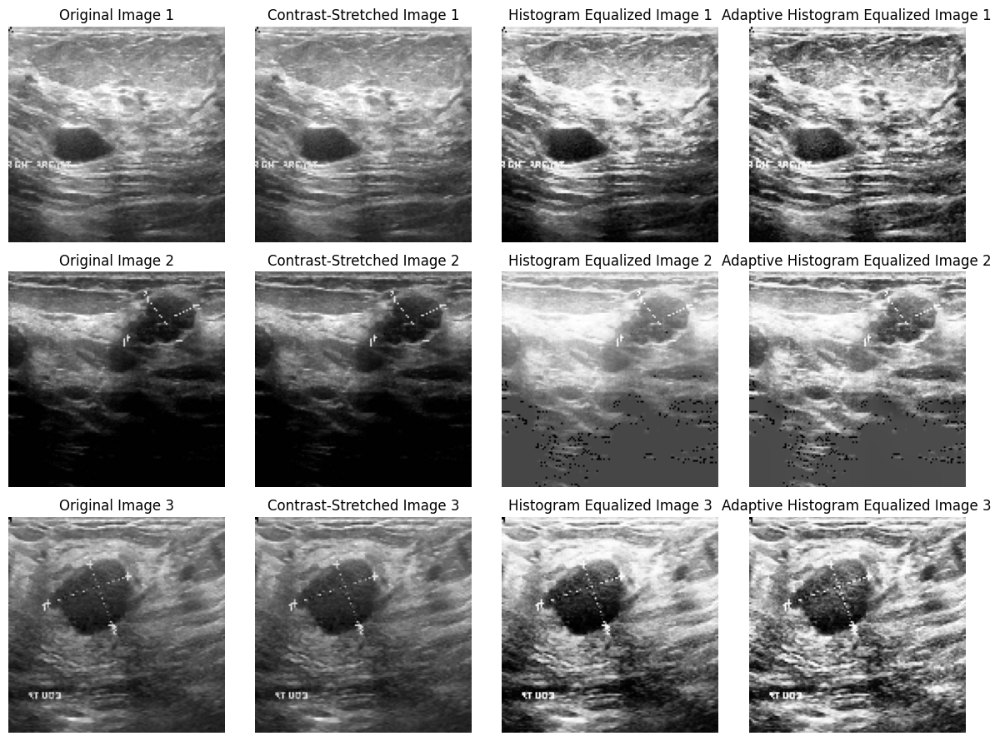

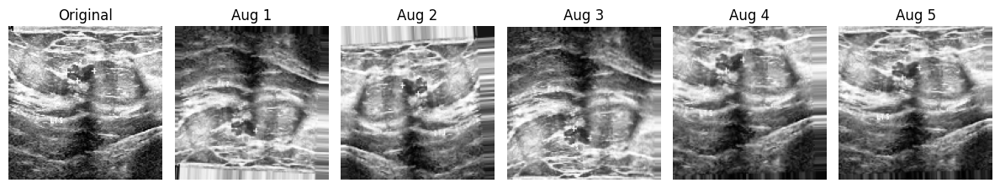

Total Augmented Image Count Per Class: Benign: 0, Normal: 0, Malignant: 555
Total Image Count After Augmentation Per Class: Benign: 437, Normal: 133, Malignant: 765
Augmented images shape: (555, 128, 128, 3)
Augmented labels shape: (555, 3)
Combined training images shape: (1218, 128, 128, 3)
Combined training labels shape: (1218, 3)
x_test shape: (117, 128, 128, 3), y_test shape: (117, 3)
y_train is one-hot encoded.
y_test is one-hot encoded.
Unique labels in y_train: [<Compressed Sparse Row sparse matrix of dtype 'float64'
 	with 1218 stored elements and shape (1218, 3)>        ]
Unique labels in y_test: [<Compressed Sparse Row sparse matrix of dtype 'float64'
 	with 117 stored elements and shape (117, 3)>          ]


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ vgg19 (Functional)              │ ?                      │    20,024,384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_10          │ ?                      │   0 (unbuilt) │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_11          │ ?                      │   0 (unbuilt) │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_12          │ ?                      │   0 (unbuilt) │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_13          │ ?                      │   0 (unbuilt) │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_14          │ ?                      │   0 (unbuilt) │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_8 (Dropout)             │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_14 (Dense)                │ ?                      │   0 (unbuilt) │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 20,024,384 (76.39 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 20,024,384 (76.39 MB)

Epoch 1/150
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 924ms/step - accuracy: 0.4182 - loss: 17.6624
Epoch 1: val_accuracy improved from -inf to 0.72131, saving model to best_model.keras
137/137 ━━━━━━━━━━━━━━━━━━━━ 145s 1s/step - accuracy: 0.4186 - loss: 17.6611 - val_accuracy: 0.7213 - val_loss: 16.7342
Epoch 2/150
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 927ms/step - accuracy: 0.6257 - loss: 16.6735
Epoch 2: val_accuracy improved from 0.72131 to 0.78689, saving model to best_model.keras
137/137 ━━━━━━━━━━━━━━━━━━━━ 141s 1s/step - accuracy: 0.6257 - loss: 16.6719 - val_accuracy: 0.7869 - val_loss: 15.8413
Epoch 3/150
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 915ms/step - accuracy: 0.6530 - loss: 15.8263
Epoch 3: val_accuracy did not improve from 0.78689
137/137 ━━━━━━━━━━━━━━━━━━━━ 140s 1s/step - accuracy: 0.6531 - loss: 15.8247 - val_accuracy: 0.7459 - val_loss: 15.0745
Epoch 4/150
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 930ms/step - accuracy: 0.7080 - loss: 14.9270
Epoch 4: val_accuracy did not improve from 0.78689
137

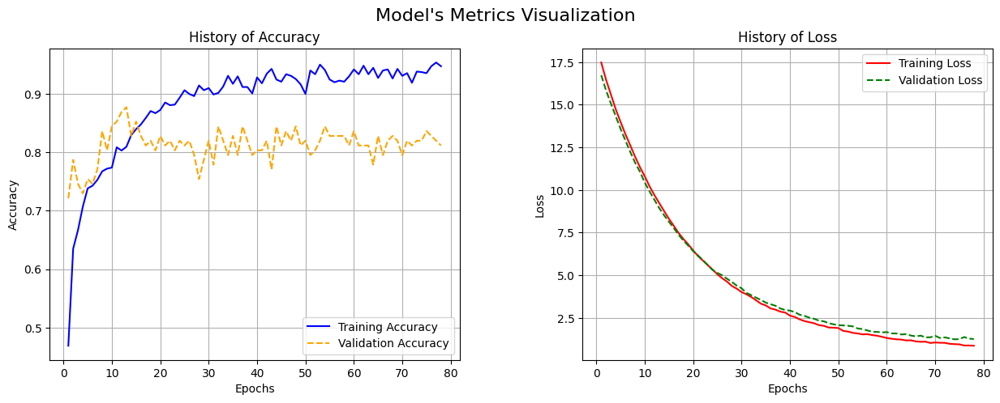

<Figure size 800x600 with 0 Axes>

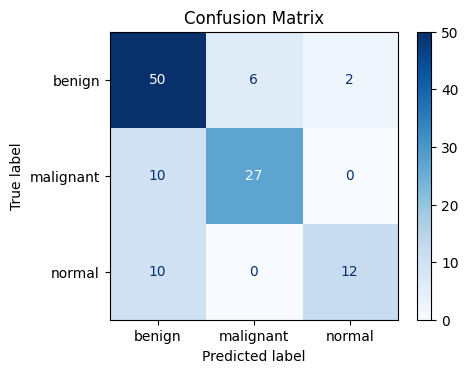

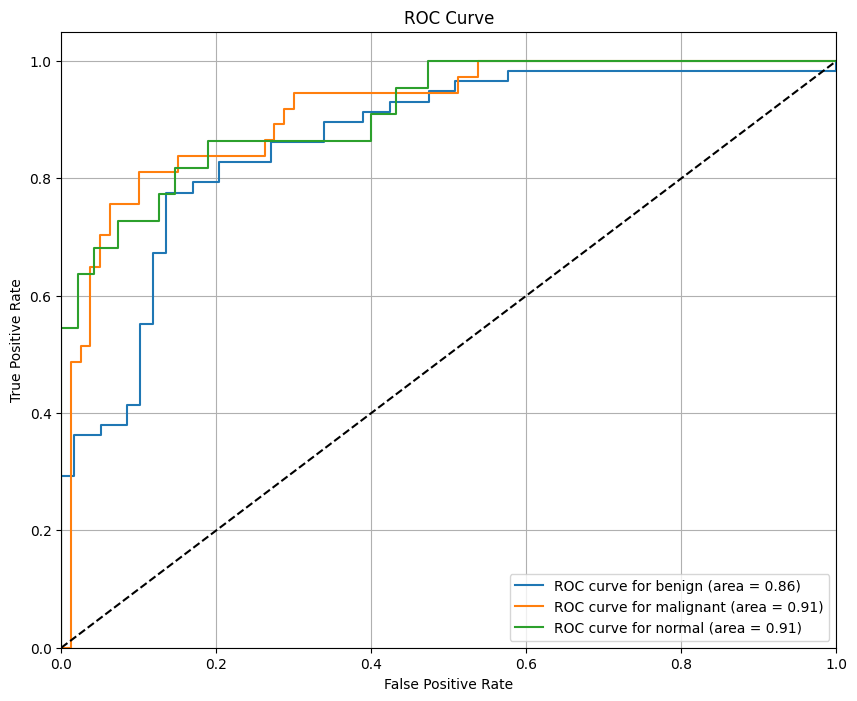

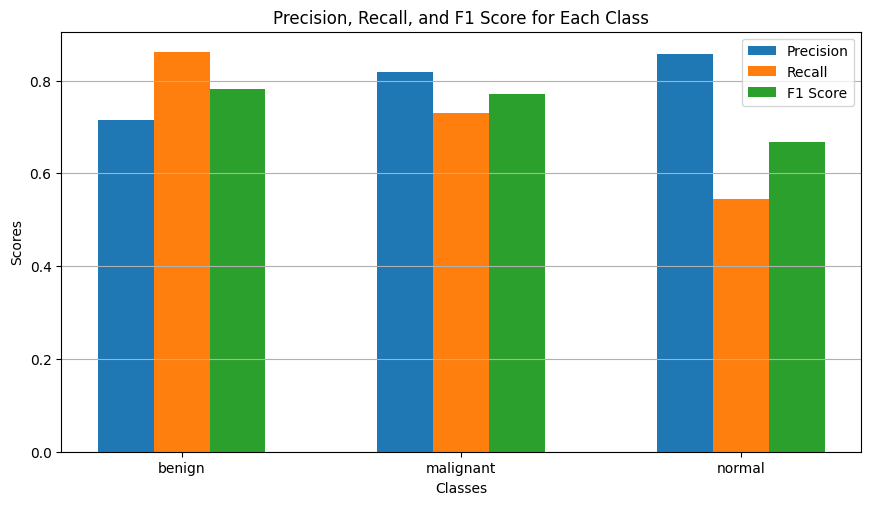

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
Prediction time for 12 samples: 2.6166 seconds


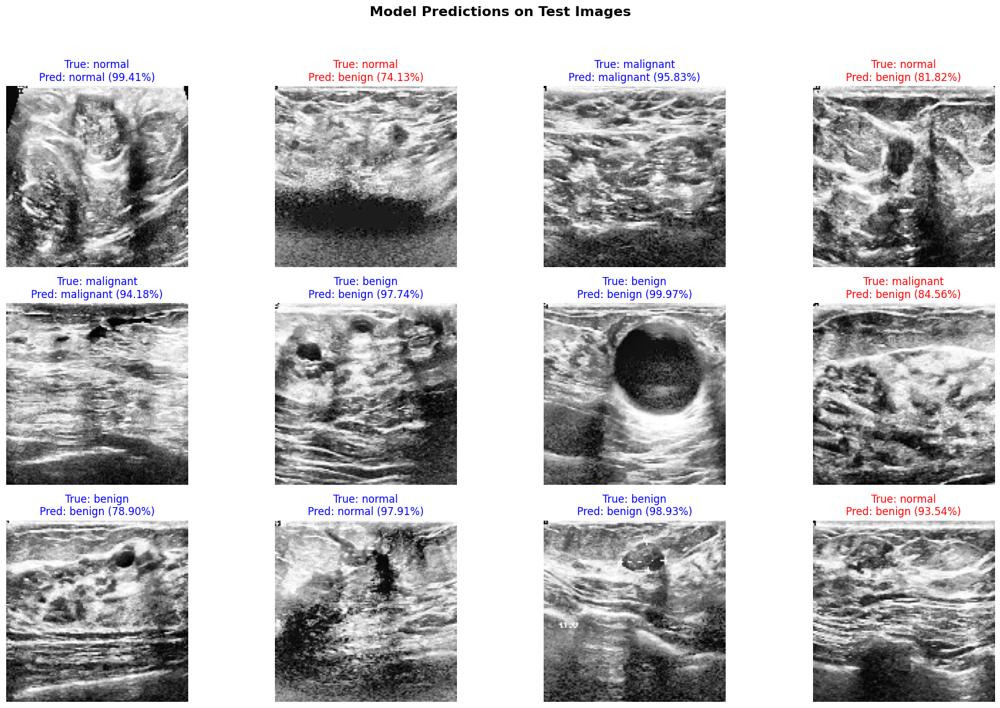

In [3]:
import numpy as np
import pandas as pd
import tensorflow as tf
import random
from tensorflow import keras
from tensorflow.keras.applications.vgg19 import VGG19
from tensorflow.keras.preprocessing.image import load_img, img_to_array, ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import (Conv2D, MaxPooling2D, AveragePooling2D,
                                     BatchNormalization, Dense, Activation,
                                     Flatten, Dropout)
from tensorflow.keras.optimizers import SGD, Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
import cv2
import matplotlib.pyplot as plt
import os
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import f1_score, roc_auc_score, cohen_kappa_score, confusion_matrix, precision_score, recall_score, RocCurveDisplay
from sklearn.metrics import roc_curve, auc, confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import RocCurveDisplay

# Define the path
path = "/kaggle/input/breast-ultrasound-images-dataset/Dataset_BUSI_with_GT"
dir_list = [os.path.join(path, i) for i in os.listdir(path)]

# Count images per label
def count_images_per_class(path):
    counts = {'benign': 0, 'normal': 0, 'malignant': 0}
    for class_name in counts:
        folder = os.path.join(path, class_name)
        counts[class_name] = sum('mask' not in img for img in os.listdir(folder))
    return counts

image_counts = count_images_per_class(path)
print("Image Counts per Class:", image_counts)

def contrast_stretching(image):
    min_pixel = np.min(image)
    max_pixel = np.max(image)
    stretched = (image - min_pixel) / (max_pixel - min_pixel)
    return stretched



def histogram_equalization(image):
    # Convert the image to uint8 if it's not
    if image.dtype != np.uint8:
        image = (image * 255).astype(np.uint8)  # Scale and convert
    # Convert to grayscale if RGB
    if len(image.shape) == 3 and image.shape[-1] == 3:
        gray_image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    else:
        gray_image = image

    # Normalize pixel values to 0-255
    normalized_image = cv2.normalize(gray_image, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

    # Apply histogram equalization
    equalized_image = cv2.equalizeHist(normalized_image)

    # Convert grayscale output to RGB
    rgb_image = cv2.cvtColor(equalized_image, cv2.COLOR_GRAY2RGB)

    return rgb_image




def adaptive_histogram_equalization(image):
    # Convert the image to uint8 if it's not
    if image.dtype != np.uint8:
        image = (image * 255).astype(np.uint8)  # Scale and convert
    
    # Convert to grayscale if RGB
    if len(image.shape) == 3 and image.shape[-1] == 3:
        gray_image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    else:
        gray_image = image

    # Normalize pixel values to 0-255
    normalized_image = cv2.normalize(gray_image, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

    # Create a CLAHE object
    # clipLimit: Threshold for contrast limiting
    # tileGridSize: Size of the grid for histogram equalization
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    
    # Apply CLAHE to the normalized image
    equalized_image = clahe.apply(normalized_image)

    # Convert grayscale output to RGB
    rgb_image = cv2.cvtColor(equalized_image, cv2.COLOR_GRAY2RGB)

    return rgb_image




# Prepare images and labels
img_size, img_channel = 128, 3
img_shape = (img_size, img_size, img_channel)
images = []
labels = []
original_images = []  # To store the original images (before any preprocessing)
hist_images = []
contrast_images = []
adapt_hist_images = []
for class_name in ['benign', 'normal', 'malignant']:
    class_folder = os.path.join(path, class_name)
    for image_name in os.listdir(class_folder):
        if 'mask' not in image_name:
            img_path = os.path.join(class_folder, image_name)
            img = load_img(img_path, target_size=(img_size, img_size))
            
            # Store the original image before any preprocessing
            img_array = img_to_array(img) / 255.0  # Normalize the images
            original_images.append(img_array.copy())  # Storing original image
            
            # Apply contrast stretching after loading
            contrast_stretched_image = contrast_stretching(img_array)  # Apply contrast stretching
            contrast_images.append(contrast_stretched_image)

            # Apply histogram equalization after loading
            histogram_equalized_image = histogram_equalization(contrast_stretched_image)
            hist_images.append(histogram_equalized_image)

            # Apply adaptive histogram equalization after loading
            adaptive_histogram_equalized_image = adaptive_histogram_equalization(histogram_equalized_image)
            adapt_hist_images.append(adaptive_histogram_equalized_image)
            labels.append(class_name)


# Convert to numpy arrays
x = np.array(adapt_hist_images)
y = np.array(labels)

# One-hot encode labels
encoder = OneHotEncoder()
y = encoder.fit_transform(y.reshape(-1, 1))

# Split the dataset
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.15, shuffle=True, random_state=42)
print(f"Training set shape: {x_train.shape}, Testing set shape: {x_test.shape}")
print(f"Training labels shape: {y_train.shape}, Testing labels shape: {y_test.shape}")


# Function to visualize original and contrast-stretched images for the first two images
def visualize_contrast_stretching(original_images, const_img, hist_img, adpt_hist_img, max_images):
    """
    Visualize contrast stretching for a limited number of images.
    Args:
        original_images: List of original images.
        const_img: List of contrast-stretched images.
        hist_img: List of histogram-equalized images.
        adpt_hist_img: List of adaptive histogram-equalized images.
        max_images: Maximum number of images to display.
    """
    # Limit the number of images to display
    num_images = min(max_images, len(original_images))
    
    fig, axes = plt.subplots(num_images, 4, figsize=(12, 3 * num_images))
    for i in range(num_images):
        
        axes[i, 0].imshow(original_images[i], cmap='gray')
        axes[i, 0].set_title(f'Original Image {i+1}')
        axes[i, 0].axis('off')

        axes[i, 1].imshow(const_img[i], cmap='gray')
        axes[i, 1].set_title(f'Contrast-Stretched Image {i+1}')
        axes[i, 1].axis('off')

        
        axes[i, 2].imshow(hist_img[i], cmap='gray')
        axes[i, 2].set_title(f'Histogram Equalized Image {i+1}')
        axes[i, 2].axis('off')

        axes[i, 3].imshow(adpt_hist_img[i], cmap='gray')
        axes[i, 3].set_title(f'Adaptive Histogram Equalized Image {i+1}')
        axes[i, 3].axis('off')

    plt.tight_layout()
    plt.show()

# Example usage: visualize contrast stretching for the first two images
visualize_contrast_stretching(original_images, contrast_images, hist_images, x, max_images=3)



#Applying different augmentation settings to minority classes:
augmentation_class1 = ImageDataGenerator(
    #rescale=1./255,
    rotation_range=5,  # Rotate images by a maximum of 10 degrees
    width_shift_range=0.1,  # Shift images horizontally by 10% of the width
    height_shift_range=0.1,  # Shift images vertically by 10% of the height
    zoom_range=0.1,  # Zoom images by 10%
    horizontal_flip=True,  # Flip images horizontally
    vertical_flip=True,  # No vertical flipping
    fill_mode='nearest'     # Fill in missing pixels using the nearest available    
)
augmentation_class2 = ImageDataGenerator(
    rotation_range=30,  # Rotate images by a maximum of 10 degrees
    width_shift_range=0.2,  # Shift images horizontally by 10% of the width
    height_shift_range=0.2,  # Shift images vertically by 10% of the height
    zoom_range=0.2,  # Zoom images by 10%
    horizontal_flip=True,  # Flip images horizontally
    vertical_flip=True,
    fill_mode='nearest'     # Fill in missing pixels using the nearest available    
)




# Function to visualize original and augmented images
def visualize_augmentation(original_image):
    """
    Visualize the augmented images for a given input image.
    
    Parameters:
        original_image: np.ndarray
            The original image to visualize augmentations for.
    """
    # Add batch dimension
    img = original_image.reshape((1,) + original_image.shape)  # (1, height, width, channels)
    
    # Ensure channel dimension exists (e.g., for grayscale images)
    if img.ndim == 3:  # Missing channel dimension
        img = np.expand_dims(img, axis=-1)  # Add channel dimension as the last axis

    # Generate augmented images
    augmented_images = augmentation_class1.flow(img, batch_size=1)

    # Plot the original and augmented images
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 6, 1)
    plt.imshow(img[0, :, :, 0], cmap='gray')  # Original image
    plt.title("Original")
    plt.axis('off')

    for i in range(5):  # Visualize 5 augmented images
        batch = next(augmented_images)  # Get the next augmented image
        aug_img = batch[0]  # Extract the image
        plt.subplot(1, 6, i + 2)
        plt.imshow(aug_img[:, :, 0], cmap='gray')  # Display augmented image
        plt.title(f"Aug {i + 1}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()



# Example usage: visualize augmentation for a random image from the dataset
random_img = x_train[0]  # Select any image from the training set
visualize_augmentation(random_img)


import os
import numpy as np
import shutil
from sklearn.utils import shuffle

# Directory to save augmented images
augmented_dir = "augmented_images"

# Clear the directory if it exists
if os.path.exists(augmented_dir):
    shutil.rmtree(augmented_dir)  # Delete the directory and its contents
os.makedirs(augmented_dir, exist_ok=True)  # Create a new, empty directory

# Augment images and store them
augmented_images, augmented_labels = [], []

# Count augmented images for each class
bc = 0  # Benign count
mc = 0  # Malignant count
nc = 0  # Normal count

for idx, (image, label) in enumerate(zip(x_train, y_train.toarray())):
    image = np.expand_dims(image, axis=0)
    label = np.expand_dims(label, axis=0)
    i = 0

    # Set the class name based on the label
    if label[0][0] == 1:
        class_name = "Benign"
    elif label[0][1] == 1:
        class_name = "Normal"
    elif label[0][2] == 1:
        class_name = "Malignant"
        
        if label[0][0] == 1:  # Benign class
            for batch in augmentation_class2.flow(
            image, 
            batch_size=1, 
            save_to_dir=augmented_dir,
            save_prefix=f"{class_name}_aug_{idx}", 
            save_format="jpg"
            ):
                augmented_images.append(batch[0])
                augmented_labels.append(label[0])
                i += 1
                bc += 1
                if i >= 2:  # Generate 2 augmented images per Benign image
                    break
        elif label[0][1] == 1:  # Normal class
            for batch in augmentation_class1.flow(
            image, 
            batch_size=1, 
            save_to_dir=augmented_dir,
            save_prefix=f"{class_name}_aug_{idx}", 
            save_format="jpg"
            ):
                augmented_images.append(batch[0])
                augmented_labels.append(label[0])
                i += 1

                nc += 1
                if i >= 4:  # Generate 4 augmented images per Normal image
                    break
        elif label[0][2] == 1:  # Malignant class
            for batch in augmentation_class1.flow(
            image, 
            batch_size=1, 
            save_to_dir=augmented_dir,
            save_prefix=f"{class_name}_aug_{idx}", 
            save_format="jpg"
            ):
                augmented_images.append(batch[0])
                augmented_labels.append(label[0])
                i += 1
            
                mc += 1
                if i >= 5:  # Generate 5 augmented images per Malignant image
                    break

# Convert augmented images and labels to arrays
augmented_images = np.array(augmented_images)
augmented_labels = np.array(augmented_labels)

# Print the number of images augmented in each class
print(f"Total Augmented Image Count Per Class: Benign: {bc}, Normal: {nc}, Malignant: {mc}")

# Print total image count after augmentation per class
print(f"Total Image Count After Augmentation Per Class: "
      f"Benign: {image_counts['benign'] + bc}, "
      f"Normal: {image_counts['normal'] + nc}, "
      f"Malignant: {image_counts['malignant'] + mc}")

# Print shapes of augmented datasets
print(f"Augmented images shape: {augmented_images.shape}")
print(f"Augmented labels shape: {augmented_labels.shape}")

# Combine original training data with augmented data
x_train_combined = np.concatenate((x_train, augmented_images), axis=0)
y_train_combined = np.concatenate((y_train.toarray(), augmented_labels), axis=0)

# Shuffle combined dataset
x_train_combined, y_train_combined = shuffle(x_train_combined, y_train_combined, random_state=42)

# Update training data
x_train = x_train_combined
y_train = y_train_combined

# Print shapes of combined datasets
print(f"Combined training images shape: {x_train.shape}")
print(f"Combined training labels shape: {y_train.shape}")

# Print shapes of test datasets
print(f"x_test shape: {x_test.shape}, y_test shape: {y_test.shape}")


import numpy as np
from scipy.sparse import issparse, csr_matrix

# Convert the one-hot encoded array to a sparse matrix
y_train = csr_matrix(y_train)

# Check label format for y_train and y_test
def check_label_format(y_train, y_test):
    # Check if y_train is one-hot encoded
    if len(y_train.shape) > 1 and y_train.shape[1] > 1:
        print("y_train is one-hot encoded.")
    else:
        print("y_train is sparse encoded (integer labels).")
    
    # Check if y_test is one-hot encoded
    if len(y_test.shape) > 1 and y_test.shape[1] > 1:
        print("y_test is one-hot encoded.")
    else:
        print("y_test is sparse encoded (integer labels).")
    
    # Check the unique values in y_train and y_test
    unique_train_labels = np.unique(y_train)
    unique_test_labels = np.unique(y_test)
    
    print(f"Unique labels in y_train: {unique_train_labels}")
    print(f"Unique labels in y_test: {unique_test_labels}")

# Example usage to check the labels before running training
check_label_format(y_train, y_test)



# Function to evaluate the model
def evaluation(model, x_train, y_train, x_val, y_val, x_test, y_test, history):
    train_loss, train_acc = model.evaluate(x_train, y_train.toarray())
    val_loss, val_acc = model.evaluate(x_val, y_val.toarray())
    test_loss_value, test_accuracy = model.evaluate(x_test, y_test.toarray())

    y_pred = model.predict(x_test)
    y_pred_label = np.argmax(y_pred, axis=1)
    y_true_label = np.argmax(y_test.toarray(), axis=1)

    f1_measure = f1_score(y_true_label, y_pred_label, average='weighted')
    roc_score = roc_auc_score(y_test.toarray(), y_pred)
    kappa_score = cohen_kappa_score(y_true_label, y_pred_label)
    precision = precision_score(y_true_label, y_pred_label, average='weighted')
    recall = recall_score(y_true_label, y_pred_label, average='weighted')
    cm = confusion_matrix(y_true_label, y_pred_label)

    print("\n--- Model Evaluation Metrics ---")
    print(f"Train accuracy: {train_acc:.4f}")
    print(f"Validation accuracy: {val_acc:.4f}")
    print(f"Test accuracy: {test_accuracy:.4f}")
    print(f"F1 Score: {f1_measure:.4f}")
    print(f"Kappa Score: {kappa_score:.4f}")
    print(f"ROC AUC Score: {roc_score:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"Recall: {recall:.4f}")

    return y_true_label, y_pred, cm


# Plotting function for model performance metrics with improved alignment and spacing
def Plotting(acc, val_acc, loss, val_loss, y_true, y_pred, cm):
    # Plot accuracy and loss
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
    fig.suptitle("Model's Metrics Visualization", fontsize=16)

    # Accuracy Plot
    ax1.plot(range(1, len(acc) + 1), acc, label='Training Accuracy', color='blue', linestyle='-')
    ax1.plot(range(1, len(val_acc) + 1), val_acc, label='Validation Accuracy', color='orange', linestyle='--')
    ax1.set_title('History of Accuracy')
    ax1.set_xlabel('Epochs')
    ax1.set_ylabel('Accuracy')
    ax1.legend()
    ax1.grid(True)

    # Loss Plot
    ax2.plot(range(1, len(loss) + 1), loss, label='Training Loss', color='red', linestyle='-')
    ax2.plot(range(1, len(val_loss) + 1), val_loss, label='Validation Loss', color='green', linestyle='--')
    ax2.set_title('History of Loss')
    ax2.set_xlabel('Epochs')
    ax2.set_ylabel('Loss')
    ax2.legend()
    ax2.grid(True)

    plt.subplots_adjust(wspace=0.3, hspace=0.5)  # Adjust space between accuracy and loss plots
    plt.show()

    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=encoder.categories_[0])
    disp.plot(cmap=plt.cm.Blues)
    plt.title("Confusion Matrix")
    plt.grid(False)  # Remove grid for clarity
    plt.subplots_adjust(left=0.2, right=0.8, top=0.8, bottom=0.2)  # Adjust spacing for clarity
    plt.show()

    # Plot ROC Curve for each class
    plt.figure(figsize=(10, 8))
    for i in range(len(encoder.categories_[0])):
        fpr, tpr, _ = roc_curve(y_true, y_pred[:, i], pos_label=i)
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, label=f'ROC curve for {encoder.categories_[0][i]} (area = {roc_auc:.2f})')

    plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend(loc='lower right')
    plt.grid(True)
    plt.show()

    # Calculate precision, recall, and F1 score for each class
    precision = precision_score(y_true, y_pred.argmax(axis=1), average=None)
    recall = recall_score(y_true, y_pred.argmax(axis=1), average=None)
    f1 = f1_score(y_true, y_pred.argmax(axis=1), average=None)

    # Bar plot for precision, recall, and F1 score with improved spacing
    metrics = [precision, recall, f1]
    metrics_names = ['Precision', 'Recall', 'F1 Score']
    class_labels = encoder.categories_[0]

    x = np.arange(len(class_labels))  # Label locations
    width = 0.2  # Width of the bars

    fig, ax = plt.subplots(figsize=(10, 6))
    for i, metric in enumerate(metrics):
        ax.bar(x + i * width, metric, width, label=metrics_names[i])

    ax.set_xlabel('Classes')
    ax.set_ylabel('Scores')
    ax.set_title('Precision, Recall, and F1 Score for Each Class')
    ax.set_xticks(x + width)
    ax.set_xticklabels(class_labels)
    ax.legend()
    plt.grid(axis='y')  # Add gridlines for readability
    plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.2)  # Adjust space around bar plots
    plt.show()



 #Fit and evaluate the model, and visualize the performance
def fit_evaluate(model, x_train, y_train, x_test, y_test, bs, Epochs, patience):
    # Early stopping to prevent overfitting
    es = EarlyStopping(monitor='val_loss', mode='min', patience=patience, restore_best_weights=True, verbose=1)
    # Model checkpoint to save the best model based on validation accuracy
    mc = ModelCheckpoint('best_model.keras', monitor='val_accuracy', mode='max', save_best_only=True, verbose=1)
    
    # Split training data further into train and validation sets
    x1_train, x_val, y1_train, y_val = train_test_split(x_train, y_train, test_size=0.1, random_state=42, stratify=y_train.toarray())
    
    # Fit the model
    history = model.fit(x1_train, y1_train.toarray(),
                        validation_data=(x_val, y_val.toarray()),
                        epochs=Epochs,
                        batch_size=bs,
                        callbacks=[es, mc])

    # Retrieve history for training and validation metrics
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    # Evaluate the model and collect true/predicted labels
    y_true, y_pred, cm = evaluation(model, x1_train, y1_train, x_val, y_val, x_test, y_test, history)

    # Plot training history, ROC curves, and class-specific precision, recall, and F1 score
    Plotting(acc, val_acc, loss, val_loss, y_true, y_pred, cm)


# Load the VGG19 model
base_model = VGG19(
    include_top=False,
    weights="imagenet",
    input_shape=img_shape,
)

for layer in base_model.layers:
    layer.trainable = False    

    
# Define and compile the VGG19 model
def VGG19():
    model = Sequential()
    model.add(base_model)
    model.add(Flatten())
    model.add(BatchNormalization())
    model.add(Dense(512, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01)))  # L2 Regularization
    model.add(BatchNormalization())
    model.add(Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01)))  # L2 Regularization
    model.add(BatchNormalization())
    model.add(Dropout(0.6))
    model.add(Dense(128, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01)))
    model.add(BatchNormalization())
    model.add(Dropout(0.6))
    model.add(Dense(64, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01)))
    model.add(BatchNormalization())
    model.add(Dropout(0.6))
    model.add(Dense(3, activation='softmax'))
    
    model.compile(optimizer=SGD(learning_rate=0.001, momentum=0.9), loss='categorical_crossentropy', metrics=['accuracy'])
    return model
    

    
    
# Instantiate and compile the VGG19 model
model = VGG19()
model.summary()

# Train the model and visualize performance
fit_evaluate(model, x_train, y_train, x_test, y_test, bs=8, Epochs=150, patience=4)



# Function to visualize multiple predictions from the dataset with added comments
import time

def visualize_model_performance(model, x_test, y_test, class_labels=['benign', 'normal', 'malignant'], num_samples=12):
    """
    Visualizes model predictions on test dataset images and logs prediction time.

    Args:
        model: Trained model to make predictions.
        x_test: Test dataset images.
        y_test: True labels for the test dataset (encoded as one-hot or sparse matrix).
        class_labels: List of class names corresponding to the labels.
        num_samples: Number of images to visualize.
    """
    # Select the first `num_samples` images from the test set
    test_images = x_test[:num_samples]
    true_labels = y_test.toarray()[:num_samples]  # Convert sparse matrix to array if needed
    true_labels = np.argmax(true_labels, axis=1)  # Get true class indices

    # Measure prediction time
    start_time = time.time()
    predictions = model.predict(test_images)
    end_time = time.time()
    prediction_time = end_time - start_time  # Calculate total prediction time

    # Log prediction time
    print(f"Prediction time for {num_samples} samples: {prediction_time:.4f} seconds")

    # Get predicted class indices
    predicted_labels = np.argmax(predictions, axis=1)

    # Set up the plotting layout for 4 images per row
    plt.figure(figsize=(18, 12))
    rows = num_samples // 4 + int(num_samples % 4 != 0)  # Calculate the required number of rows

    for i, (img, true_label, pred_label, pred_prob) in enumerate(zip(test_images, true_labels, predicted_labels, predictions)):
        plt.subplot(rows, 4, i + 1)  # Arrange images in 4 columns
        plt.imshow(img)
        plt.axis('off')
        plt.title(f"True: {class_labels[true_label]}\nPred: {class_labels[pred_label]} ({max(pred_prob) * 100:.2f}%)",
                  fontsize=12, color="blue" if true_label == pred_label else "red")  # Color title based on correctness

    # Add bold title and adjust spacing
    plt.subplots_adjust(wspace=0.4, hspace=0.6)  # Adjust spacing between plots
    plt.suptitle("Model Predictions on Test Images", fontsize=16, fontweight="bold")
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

# Call the updated function to visualize predictions on the first 12 test images
visualize_model_performance(model, x_test, y_test)


Image Counts per Class: {'benign': 437, 'normal': 133, 'malignant': 210}
Training set shape: (663, 128, 128, 3), Testing set shape: (117, 128, 128, 3)
Training labels shape: (663, 3), Testing labels shape: (117, 3)


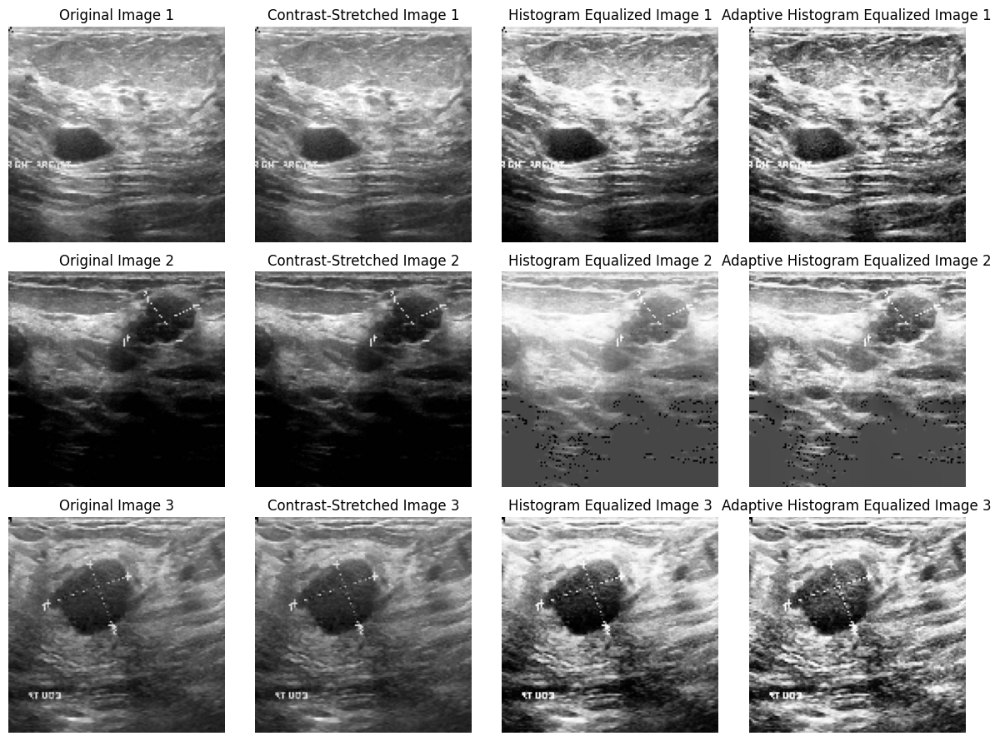

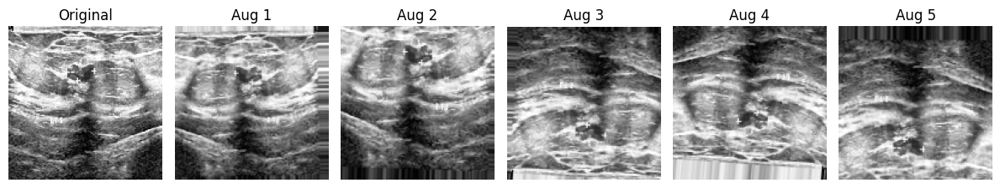

Total Augmented Image Count Per Class: Benign: 0, Normal: 0, Malignant: 555
Total Image Count After Augmentation Per Class: Benign: 437, Normal: 133, Malignant: 765
Augmented images shape: (555, 128, 128, 3)
Augmented labels shape: (555, 3)
Combined training images shape: (1218, 128, 128, 3)
Combined training labels shape: (1218, 3)
x_test shape: (117, 128, 128, 3), y_test shape: (117, 3)
y_train is one-hot encoded.
y_test is one-hot encoded.
Unique labels in y_train: [<Compressed Sparse Row sparse matrix of dtype 'float64'
 	with 1218 stored elements and shape (1218, 3)>        ]
Unique labels in y_test: [<Compressed Sparse Row sparse matrix of dtype 'float64'
 	with 117 stored elements and shape (117, 3)>          ]


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ vgg19 (Functional)              │ ?                      │    20,024,384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_3 (Flatten)             │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_15          │ ?                      │   0 (unbuilt) │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_15 (Dense)                │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_16          │ ?                      │   0 (unbuilt) │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_16 (Dense)                │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_17          │ ?                      │   0 (unbuilt) │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_9 (Dropout)             │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_17 (Dense)                │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_18          │ ?                      │   0 (unbuilt) │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_10 (Dropout)            │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_18 (Dense)                │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_19          │ ?                      │   0 (unbuilt) │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_11 (Dropout)            │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_19 (Dense)                │ ?                      │   0 (unbuilt) │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 20,024,384 (76.39 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 20,024,384 (76.39 MB)

Epoch 1/150
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 967ms/step - accuracy: 0.3780 - loss: 17.8649
Epoch 1: val_accuracy improved from -inf to 0.75410, saving model to best_model.keras
137/137 ━━━━━━━━━━━━━━━━━━━━ 153s 1s/step - accuracy: 0.3786 - loss: 17.8644 - val_accuracy: 0.7541 - val_loss: 17.0191
Epoch 2/150
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 944ms/step - accuracy: 0.6118 - loss: 17.0587
Epoch 2: val_accuracy improved from 0.75410 to 0.78689, saving model to best_model.keras
137/137 ━━━━━━━━━━━━━━━━━━━━ 198s 1s/step - accuracy: 0.6120 - loss: 17.0570 - val_accuracy: 0.7869 - val_loss: 16.0443
Epoch 3/150
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 936ms/step - accuracy: 0.6788 - loss: 16.0790
Epoch 3: val_accuracy did not improve from 0.78689
137/137 ━━━━━━━━━━━━━━━━━━━━ 149s 1s/step - accuracy: 0.6790 - loss: 16.0774 - val_accuracy: 0.7869 - val_loss: 15.2521
Epoch 4/150
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 942ms/step - accuracy: 0.7008 - loss: 15.2596
Epoch 4: val_accuracy did not improve from 0.78689
137

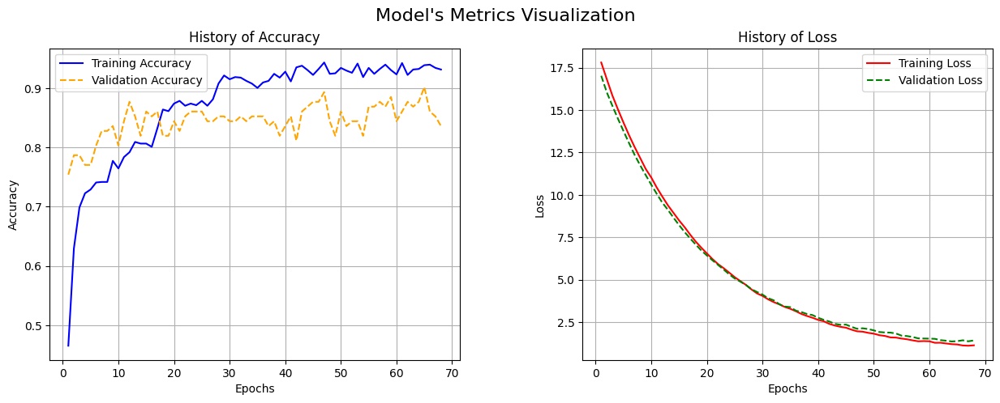

<Figure size 800x600 with 0 Axes>

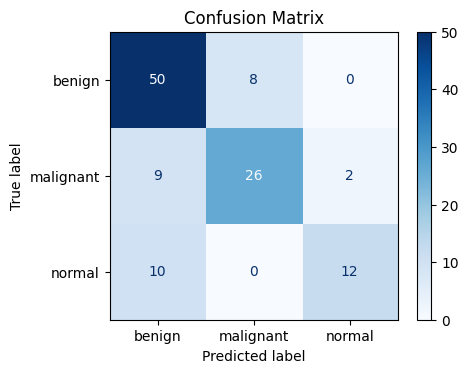

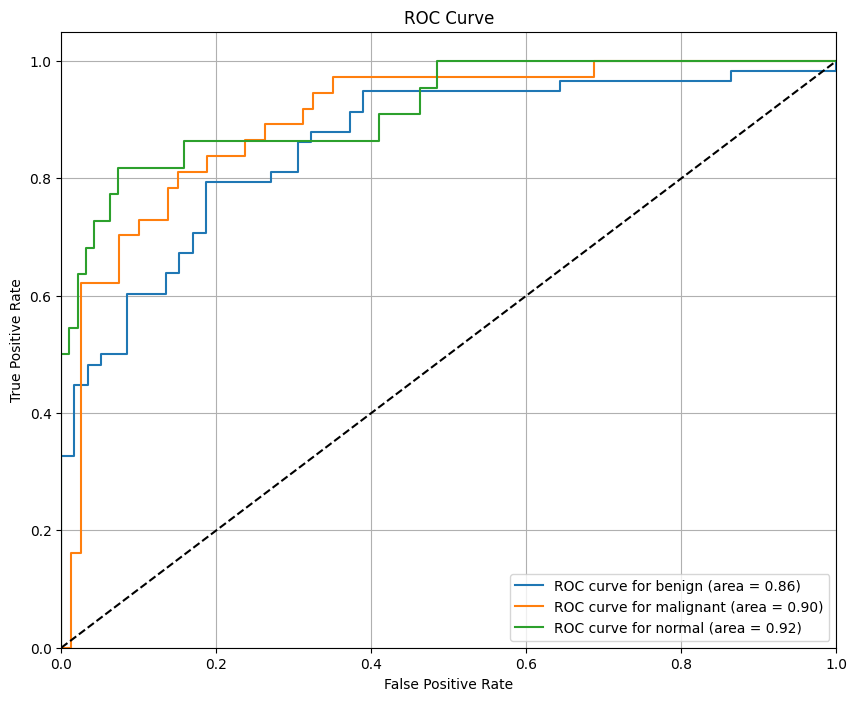

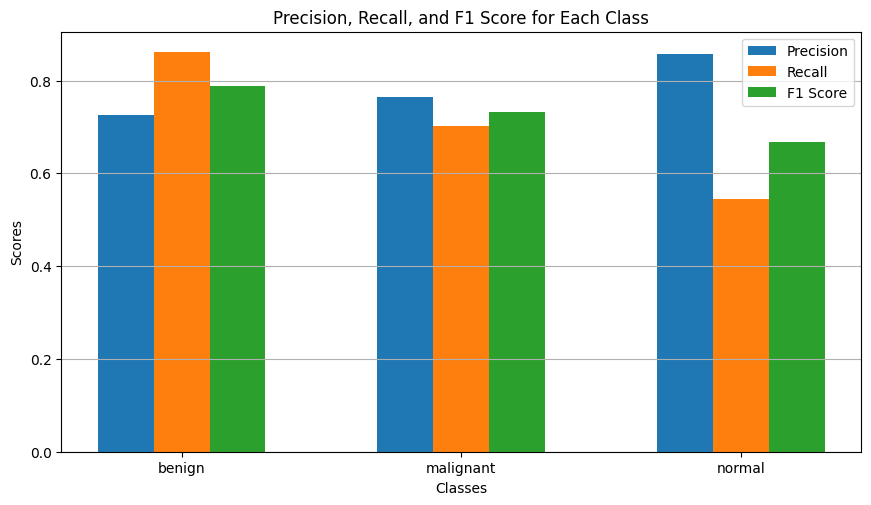

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
Prediction time for 12 samples: 1.3846 seconds


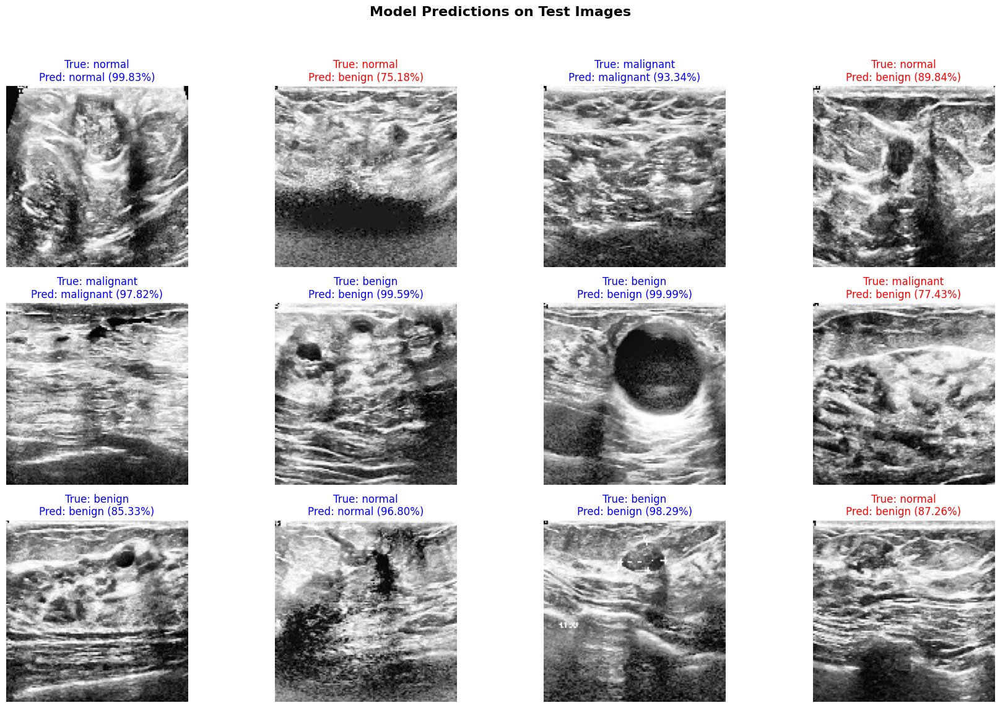

In [4]:
import numpy as np
import pandas as pd
import tensorflow as tf
import random
from tensorflow import keras
from tensorflow.keras.applications.vgg19 import VGG19
from tensorflow.keras.preprocessing.image import load_img, img_to_array, ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import (Conv2D, MaxPooling2D, AveragePooling2D,
                                     BatchNormalization, Dense, Activation,
                                     Flatten, Dropout)
from tensorflow.keras.optimizers import SGD, Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
import cv2
import matplotlib.pyplot as plt
import os
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import f1_score, roc_auc_score, cohen_kappa_score, confusion_matrix, precision_score, recall_score, RocCurveDisplay
from sklearn.metrics import roc_curve, auc, confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import RocCurveDisplay

# Define the path
path = "/kaggle/input/breast-ultrasound-images-dataset/Dataset_BUSI_with_GT"
dir_list = [os.path.join(path, i) for i in os.listdir(path)]

# Count images per label
def count_images_per_class(path):
    counts = {'benign': 0, 'normal': 0, 'malignant': 0}
    for class_name in counts:
        folder = os.path.join(path, class_name)
        counts[class_name] = sum('mask' not in img for img in os.listdir(folder))
    return counts

image_counts = count_images_per_class(path)
print("Image Counts per Class:", image_counts)

def contrast_stretching(image):
    min_pixel = np.min(image)
    max_pixel = np.max(image)
    stretched = (image - min_pixel) / (max_pixel - min_pixel)
    return stretched



def histogram_equalization(image):
    # Convert the image to uint8 if it's not
    if image.dtype != np.uint8:
        image = (image * 255).astype(np.uint8)  # Scale and convert
    # Convert to grayscale if RGB
    if len(image.shape) == 3 and image.shape[-1] == 3:
        gray_image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    else:
        gray_image = image

    # Normalize pixel values to 0-255
    normalized_image = cv2.normalize(gray_image, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

    # Apply histogram equalization
    equalized_image = cv2.equalizeHist(normalized_image)

    # Convert grayscale output to RGB
    rgb_image = cv2.cvtColor(equalized_image, cv2.COLOR_GRAY2RGB)

    return rgb_image




def adaptive_histogram_equalization(image):
    # Convert the image to uint8 if it's not
    if image.dtype != np.uint8:
        image = (image * 255).astype(np.uint8)  # Scale and convert
    
    # Convert to grayscale if RGB
    if len(image.shape) == 3 and image.shape[-1] == 3:
        gray_image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    else:
        gray_image = image

    # Normalize pixel values to 0-255
    normalized_image = cv2.normalize(gray_image, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

    # Create a CLAHE object
    # clipLimit: Threshold for contrast limiting
    # tileGridSize: Size of the grid for histogram equalization
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    
    # Apply CLAHE to the normalized image
    equalized_image = clahe.apply(normalized_image)

    # Convert grayscale output to RGB
    rgb_image = cv2.cvtColor(equalized_image, cv2.COLOR_GRAY2RGB)

    return rgb_image




# Prepare images and labels
img_size, img_channel = 128, 3
img_shape = (img_size, img_size, img_channel)
images = []
labels = []
original_images = []  # To store the original images (before any preprocessing)
hist_images = []
contrast_images = []
adapt_hist_images = []
for class_name in ['benign', 'normal', 'malignant']:
    class_folder = os.path.join(path, class_name)
    for image_name in os.listdir(class_folder):
        if 'mask' not in image_name:
            img_path = os.path.join(class_folder, image_name)
            img = load_img(img_path, target_size=(img_size, img_size))
            
            # Store the original image before any preprocessing
            img_array = img_to_array(img) / 255.0  # Normalize the images
            original_images.append(img_array.copy())  # Storing original image
            
            # Apply contrast stretching after loading
            contrast_stretched_image = contrast_stretching(img_array)  # Apply contrast stretching
            contrast_images.append(contrast_stretched_image)

            # Apply histogram equalization after loading
            histogram_equalized_image = histogram_equalization(contrast_stretched_image)
            hist_images.append(histogram_equalized_image)

            # Apply adaptive histogram equalization after loading
            adaptive_histogram_equalized_image = adaptive_histogram_equalization(histogram_equalized_image)
            adapt_hist_images.append(adaptive_histogram_equalized_image)
            labels.append(class_name)


# Convert to numpy arrays
x = np.array(adapt_hist_images)
y = np.array(labels)

# One-hot encode labels
encoder = OneHotEncoder()
y = encoder.fit_transform(y.reshape(-1, 1))

# Split the dataset
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.15, shuffle=True, random_state=42)
print(f"Training set shape: {x_train.shape}, Testing set shape: {x_test.shape}")
print(f"Training labels shape: {y_train.shape}, Testing labels shape: {y_test.shape}")


# Function to visualize original and contrast-stretched images for the first two images
def visualize_contrast_stretching(original_images, const_img, hist_img, adpt_hist_img, max_images):
    """
    Visualize contrast stretching for a limited number of images.
    Args:
        original_images: List of original images.
        const_img: List of contrast-stretched images.
        hist_img: List of histogram-equalized images.
        adpt_hist_img: List of adaptive histogram-equalized images.
        max_images: Maximum number of images to display.
    """
    # Limit the number of images to display
    num_images = min(max_images, len(original_images))
    
    fig, axes = plt.subplots(num_images, 4, figsize=(12, 3 * num_images))
    for i in range(num_images):
        
        axes[i, 0].imshow(original_images[i], cmap='gray')
        axes[i, 0].set_title(f'Original Image {i+1}')
        axes[i, 0].axis('off')

        axes[i, 1].imshow(const_img[i], cmap='gray')
        axes[i, 1].set_title(f'Contrast-Stretched Image {i+1}')
        axes[i, 1].axis('off')

        
        axes[i, 2].imshow(hist_img[i], cmap='gray')
        axes[i, 2].set_title(f'Histogram Equalized Image {i+1}')
        axes[i, 2].axis('off')

        axes[i, 3].imshow(adpt_hist_img[i], cmap='gray')
        axes[i, 3].set_title(f'Adaptive Histogram Equalized Image {i+1}')
        axes[i, 3].axis('off')

    plt.tight_layout()
    plt.show()

# Example usage: visualize contrast stretching for the first two images
visualize_contrast_stretching(original_images, contrast_images, hist_images, x, max_images=3)



#Applying different augmentation settings to minority classes:
augmentation_class1 = ImageDataGenerator(
    #rescale=1./255,
    rotation_range=5,  # Rotate images by a maximum of 10 degrees
    width_shift_range=0.1,  # Shift images horizontally by 10% of the width
    height_shift_range=0.1,  # Shift images vertically by 10% of the height
    zoom_range=0.1,  # Zoom images by 10%
    horizontal_flip=True,  # Flip images horizontally
    vertical_flip=True,  # No vertical flipping
    fill_mode='nearest'     # Fill in missing pixels using the nearest available    
)

augmentation_class2 = ImageDataGenerator(
    rotation_range=30,  # Rotate images by a maximum of 10 degrees
    width_shift_range=0.2,  # Shift images horizontally by 10% of the width
    height_shift_range=0.2,  # Shift images vertically by 10% of the height
    zoom_range=0.2,  # Zoom images by 10%
    horizontal_flip=True,  # Flip images horizontally
    vertical_flip=True,
    fill_mode='nearest'     # Fill in missing pixels using the nearest available    
)

datagen = ImageDataGenerator(
    horizontal_flip=True,   # Flip images horizontally
    vertical_flip=True,     # Flip images vertically
    fill_mode='nearest'     # Fill in missing pixels using the nearest available
)




# Function to visualize original and augmented images
def visualize_augmentation(original_image):
    """
    Visualize the augmented images for a given input image.
    
    Parameters:
        original_image: np.ndarray
            The original image to visualize augmentations for.
    """
    # Add batch dimension
    img = original_image.reshape((1,) + original_image.shape)  # (1, height, width, channels)
    
    # Ensure channel dimension exists (e.g., for grayscale images)
    if img.ndim == 3:  # Missing channel dimension
        img = np.expand_dims(img, axis=-1)  # Add channel dimension as the last axis

    # Generate augmented images
    augmented_images = augmentation_class1.flow(img, batch_size=1)

    # Plot the original and augmented images
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 6, 1)
    plt.imshow(img[0, :, :, 0], cmap='gray')  # Original image
    plt.title("Original")
    plt.axis('off')

    for i in range(5):  # Visualize 5 augmented images
        batch = next(augmented_images)  # Get the next augmented image
        aug_img = batch[0]  # Extract the image
        plt.subplot(1, 6, i + 2)
        plt.imshow(aug_img[:, :, 0], cmap='gray')  # Display augmented image
        plt.title(f"Aug {i + 1}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()



# Example usage: visualize augmentation for a random image from the dataset
random_img = x_train[0]  # Select any image from the training set
visualize_augmentation(random_img)


import os
import numpy as np
import shutil
from sklearn.utils import shuffle

# Directory to save augmented images
augmented_dir = "augmented_images"

# Clear the directory if it exists
if os.path.exists(augmented_dir):
    shutil.rmtree(augmented_dir)  # Delete the directory and its contents
os.makedirs(augmented_dir, exist_ok=True)  # Create a new, empty directory

# Augment images and store them
augmented_images, augmented_labels = [], []

# Count augmented images for each class
bc = 0  # Benign count
mc = 0  # Malignant count
nc = 0  # Normal count

for idx, (image, label) in enumerate(zip(x_train, y_train.toarray())):
    image = np.expand_dims(image, axis=0)
    label = np.expand_dims(label, axis=0)
    i = 0

    # Set the class name based on the label
    if label[0][0] == 1:
        class_name = "Benign"
    elif label[0][1] == 1:
        class_name = "Normal"
    elif label[0][2] == 1:
        class_name = "Malignant"
        
        if label[0][0] == 1:  # Benign class
            for batch in ImageDataGenerator.flow(
            image, 
            batch_size=1, 
            save_to_dir=augmented_dir,
            save_prefix=f"{class_name}_aug_{idx}", 
            save_format="jpg"
            ):
                augmented_images.append(batch[0])
                augmented_labels.append(label[0])
                i += 1
                bc += 1
                if i >= 2:  # Generate 2 augmented images per Benign image
                    break
        elif label[0][1] == 1:  # Normal class
            for batch in augmentation_class2.flow(
            image, 
            batch_size=1, 
            save_to_dir=augmented_dir,
            save_prefix=f"{class_name}_aug_{idx}", 
            save_format="jpg"
            ):
                augmented_images.append(batch[0])
                augmented_labels.append(label[0])
                i += 1

                nc += 1
                if i >= 4:  # Generate 4 augmented images per Normal image
                    break
        elif label[0][2] == 1:  # Malignant class
            for batch in augmentation_class1.flow(
            image, 
            batch_size=1, 
            save_to_dir=augmented_dir,
            save_prefix=f"{class_name}_aug_{idx}", 
            save_format="jpg"
            ):
                augmented_images.append(batch[0])
                augmented_labels.append(label[0])
                i += 1
            
                mc += 1
                if i >= 5:  # Generate 5 augmented images per Malignant image
                    break

# Convert augmented images and labels to arrays
augmented_images = np.array(augmented_images)
augmented_labels = np.array(augmented_labels)

# Print the number of images augmented in each class
print(f"Total Augmented Image Count Per Class: Benign: {bc}, Normal: {nc}, Malignant: {mc}")

# Print total image count after augmentation per class
print(f"Total Image Count After Augmentation Per Class: "
      f"Benign: {image_counts['benign'] + bc}, "
      f"Normal: {image_counts['normal'] + nc}, "
      f"Malignant: {image_counts['malignant'] + mc}")

# Print shapes of augmented datasets
print(f"Augmented images shape: {augmented_images.shape}")
print(f"Augmented labels shape: {augmented_labels.shape}")

# Combine original training data with augmented data
x_train_combined = np.concatenate((x_train, augmented_images), axis=0)
y_train_combined = np.concatenate((y_train.toarray(), augmented_labels), axis=0)

# Shuffle combined dataset
x_train_combined, y_train_combined = shuffle(x_train_combined, y_train_combined, random_state=42)

# Update training data
x_train = x_train_combined
y_train = y_train_combined

# Print shapes of combined datasets
print(f"Combined training images shape: {x_train.shape}")
print(f"Combined training labels shape: {y_train.shape}")

# Print shapes of test datasets
print(f"x_test shape: {x_test.shape}, y_test shape: {y_test.shape}")


import numpy as np
from scipy.sparse import issparse, csr_matrix

# Convert the one-hot encoded array to a sparse matrix
y_train = csr_matrix(y_train)

# Check label format for y_train and y_test
def check_label_format(y_train, y_test):
    # Check if y_train is one-hot encoded
    if len(y_train.shape) > 1 and y_train.shape[1] > 1:
        print("y_train is one-hot encoded.")
    else:
        print("y_train is sparse encoded (integer labels).")
    
    # Check if y_test is one-hot encoded
    if len(y_test.shape) > 1 and y_test.shape[1] > 1:
        print("y_test is one-hot encoded.")
    else:
        print("y_test is sparse encoded (integer labels).")
    
    # Check the unique values in y_train and y_test
    unique_train_labels = np.unique(y_train)
    unique_test_labels = np.unique(y_test)
    
    print(f"Unique labels in y_train: {unique_train_labels}")
    print(f"Unique labels in y_test: {unique_test_labels}")

# Example usage to check the labels before running training
check_label_format(y_train, y_test)



# Function to evaluate the model
def evaluation(model, x_train, y_train, x_val, y_val, x_test, y_test, history):
    train_loss, train_acc = model.evaluate(x_train, y_train.toarray())
    val_loss, val_acc = model.evaluate(x_val, y_val.toarray())
    test_loss_value, test_accuracy = model.evaluate(x_test, y_test.toarray())

    y_pred = model.predict(x_test)
    y_pred_label = np.argmax(y_pred, axis=1)
    y_true_label = np.argmax(y_test.toarray(), axis=1)

    f1_measure = f1_score(y_true_label, y_pred_label, average='weighted')
    roc_score = roc_auc_score(y_test.toarray(), y_pred)
    kappa_score = cohen_kappa_score(y_true_label, y_pred_label)
    precision = precision_score(y_true_label, y_pred_label, average='weighted')
    recall = recall_score(y_true_label, y_pred_label, average='weighted')
    cm = confusion_matrix(y_true_label, y_pred_label)

    print("\n--- Model Evaluation Metrics ---")
    print(f"Train accuracy: {train_acc:.4f}")
    print(f"Validation accuracy: {val_acc:.4f}")
    print(f"Test accuracy: {test_accuracy:.4f}")
    print(f"F1 Score: {f1_measure:.4f}")
    print(f"Kappa Score: {kappa_score:.4f}")
    print(f"ROC AUC Score: {roc_score:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"Recall: {recall:.4f}")

    return y_true_label, y_pred, cm


# Plotting function for model performance metrics with improved alignment and spacing
def Plotting(acc, val_acc, loss, val_loss, y_true, y_pred, cm):
    # Plot accuracy and loss
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
    fig.suptitle("Model's Metrics Visualization", fontsize=16)

    # Accuracy Plot
    ax1.plot(range(1, len(acc) + 1), acc, label='Training Accuracy', color='blue', linestyle='-')
    ax1.plot(range(1, len(val_acc) + 1), val_acc, label='Validation Accuracy', color='orange', linestyle='--')
    ax1.set_title('History of Accuracy')
    ax1.set_xlabel('Epochs')
    ax1.set_ylabel('Accuracy')
    ax1.legend()
    ax1.grid(True)

    # Loss Plot
    ax2.plot(range(1, len(loss) + 1), loss, label='Training Loss', color='red', linestyle='-')
    ax2.plot(range(1, len(val_loss) + 1), val_loss, label='Validation Loss', color='green', linestyle='--')
    ax2.set_title('History of Loss')
    ax2.set_xlabel('Epochs')
    ax2.set_ylabel('Loss')
    ax2.legend()
    ax2.grid(True)

    plt.subplots_adjust(wspace=0.3, hspace=0.5)  # Adjust space between accuracy and loss plots
    plt.show()

    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=encoder.categories_[0])
    disp.plot(cmap=plt.cm.Blues)
    plt.title("Confusion Matrix")
    plt.grid(False)  # Remove grid for clarity
    plt.subplots_adjust(left=0.2, right=0.8, top=0.8, bottom=0.2)  # Adjust spacing for clarity
    plt.show()

    # Plot ROC Curve for each class
    plt.figure(figsize=(10, 8))
    for i in range(len(encoder.categories_[0])):
        fpr, tpr, _ = roc_curve(y_true, y_pred[:, i], pos_label=i)
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, label=f'ROC curve for {encoder.categories_[0][i]} (area = {roc_auc:.2f})')

    plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend(loc='lower right')
    plt.grid(True)
    plt.show()

    # Calculate precision, recall, and F1 score for each class
    precision = precision_score(y_true, y_pred.argmax(axis=1), average=None)
    recall = recall_score(y_true, y_pred.argmax(axis=1), average=None)
    f1 = f1_score(y_true, y_pred.argmax(axis=1), average=None)

    # Bar plot for precision, recall, and F1 score with improved spacing
    metrics = [precision, recall, f1]
    metrics_names = ['Precision', 'Recall', 'F1 Score']
    class_labels = encoder.categories_[0]

    x = np.arange(len(class_labels))  # Label locations
    width = 0.2  # Width of the bars

    fig, ax = plt.subplots(figsize=(10, 6))
    for i, metric in enumerate(metrics):
        ax.bar(x + i * width, metric, width, label=metrics_names[i])

    ax.set_xlabel('Classes')
    ax.set_ylabel('Scores')
    ax.set_title('Precision, Recall, and F1 Score for Each Class')
    ax.set_xticks(x + width)
    ax.set_xticklabels(class_labels)
    ax.legend()
    plt.grid(axis='y')  # Add gridlines for readability
    plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.2)  # Adjust space around bar plots
    plt.show()



 #Fit and evaluate the model, and visualize the performance
def fit_evaluate(model, x_train, y_train, x_test, y_test, bs, Epochs, patience):
    # Early stopping to prevent overfitting
    es = EarlyStopping(monitor='val_loss', mode='min', patience=patience, restore_best_weights=True, verbose=1)
    # Model checkpoint to save the best model based on validation accuracy
    mc = ModelCheckpoint('best_model.keras', monitor='val_accuracy', mode='max', save_best_only=True, verbose=1)
    
    # Split training data further into train and validation sets
    x1_train, x_val, y1_train, y_val = train_test_split(x_train, y_train, test_size=0.1, random_state=42, stratify=y_train.toarray())
    
    # Fit the model
    history = model.fit(x1_train, y1_train.toarray(),
                        validation_data=(x_val, y_val.toarray()),
                        epochs=Epochs,
                        batch_size=bs,
                        callbacks=[es, mc])

    # Retrieve history for training and validation metrics
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    # Evaluate the model and collect true/predicted labels
    y_true, y_pred, cm = evaluation(model, x1_train, y1_train, x_val, y_val, x_test, y_test, history)

    # Plot training history, ROC curves, and class-specific precision, recall, and F1 score
    Plotting(acc, val_acc, loss, val_loss, y_true, y_pred, cm)


# Load the VGG19 model
base_model = VGG19(
    include_top=False,
    weights="imagenet",
    input_shape=img_shape,
)

for layer in base_model.layers:
    layer.trainable = False    

    
# Define and compile the VGG19 model
def VGG19():
    model = Sequential()
    model.add(base_model)
    model.add(Flatten())
    model.add(BatchNormalization())
    model.add(Dense(512, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01)))  # L2 Regularization
    model.add(BatchNormalization())
    model.add(Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01)))  # L2 Regularization
    model.add(BatchNormalization())
    model.add(Dropout(0.6))
    model.add(Dense(128, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01)))
    model.add(BatchNormalization())
    model.add(Dropout(0.6))
    model.add(Dense(64, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01)))
    model.add(BatchNormalization())
    model.add(Dropout(0.6))
    model.add(Dense(3, activation='softmax'))
    
    model.compile(optimizer=SGD(learning_rate=0.001, momentum=0.9), loss='categorical_crossentropy', metrics=['accuracy'])
    return model
    

    
    
# Instantiate and compile the VGG19 model
model = VGG19()
model.summary()

# Train the model and visualize performance
fit_evaluate(model, x_train, y_train, x_test, y_test, bs=8, Epochs=150, patience=4)



# Function to visualize multiple predictions from the dataset with added comments
import time

def visualize_model_performance(model, x_test, y_test, class_labels=['benign', 'normal', 'malignant'], num_samples=12):
    """
    Visualizes model predictions on test dataset images and logs prediction time.

    Args:
        model: Trained model to make predictions.
        x_test: Test dataset images.
        y_test: True labels for the test dataset (encoded as one-hot or sparse matrix).
        class_labels: List of class names corresponding to the labels.
        num_samples: Number of images to visualize.
    """
    # Select the first `num_samples` images from the test set
    test_images = x_test[:num_samples]
    true_labels = y_test.toarray()[:num_samples]  # Convert sparse matrix to array if needed
    true_labels = np.argmax(true_labels, axis=1)  # Get true class indices

    # Measure prediction time
    start_time = time.time()
    predictions = model.predict(test_images)
    end_time = time.time()
    prediction_time = end_time - start_time  # Calculate total prediction time

    # Log prediction time
    print(f"Prediction time for {num_samples} samples: {prediction_time:.4f} seconds")

    # Get predicted class indices
    predicted_labels = np.argmax(predictions, axis=1)

    # Set up the plotting layout for 4 images per row
    plt.figure(figsize=(18, 12))
    rows = num_samples // 4 + int(num_samples % 4 != 0)  # Calculate the required number of rows

    for i, (img, true_label, pred_label, pred_prob) in enumerate(zip(test_images, true_labels, predicted_labels, predictions)):
        plt.subplot(rows, 4, i + 1)  # Arrange images in 4 columns
        plt.imshow(img)
        plt.axis('off')
        plt.title(f"True: {class_labels[true_label]}\nPred: {class_labels[pred_label]} ({max(pred_prob) * 100:.2f}%)",
                  fontsize=12, color="blue" if true_label == pred_label else "red")  # Color title based on correctness

    # Add bold title and adjust spacing
    plt.subplots_adjust(wspace=0.4, hspace=0.6)  # Adjust spacing between plots
    plt.suptitle("Model Predictions on Test Images", fontsize=16, fontweight="bold")
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

# Call the updated function to visualize predictions on the first 12 test images
visualize_model_performance(model, x_test, y_test)
